# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [60]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

DATA = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, used=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if used != None:
    D = ', '.join(used)
    used += ['wml']
    data = data[used]
    print(f"훈련에 사용되는 변수 들 : {D}")

  return data

In [55]:
case3 = ['mvol_cum6', 'cum_loser_t_2_4', 'cum_loser_t_5_8', 'cum_loser_t_9_12', 'cum_winner']
case_name = 'CASE_3'
df = preprocessing(DATA, used=case3)

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 사용되는 변수 들 : mvol_cum6, cum_loser_t_2_4, cum_loser_t_5_8, cum_loser_t_9_12, cum_winner


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df

In [13]:
dynmom = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [14]:
def Roling_Windows(data, window_size, method, model):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
      'TRAIN_START_DATE':[], # 훈련 데이터 시작 지점
      'TRAIN_END_DATE':[], # 훈련 데이터 마지막 지점
      'TEST_DATE':[], # 테스트 데이터 지점
      'wml':[], # wml 값
      'dynamic_momentum':[], # 다이나믹 모멘텀 값
      'Actual_POS_WML':[], # 실제 Target 값 (0 or 1)
      'dynamic_leverage':[], # 추론된 Target 확률값
      'static_leverage':[], # 추론된 Target 값 (0 or 1)
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml', 'wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml', 'wml'])
    y_test = test['pos_wml'] 

    wml_test = list(test['wml'])

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['wml'].append(wml_test[0])

    dynamic_momentum = prob_test[0][-1] * wml_test[0]
    result_dict['dynamic_momentum'].append(dynamic_momentum)

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict['static_leverage'].append(pred_test[0])
    result_dict['dynamic_leverage'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [15]:
def plot_result(data):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data['static_leverage']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data['static_leverage'])
  precision = precision_score(data['Actual_POS_WML'], data['static_leverage'])
  recall = recall_score(data['Actual_POS_WML'], data['static_leverage'])
  F1_score = f1_score(data['Actual_POS_WML'], data['static_leverage'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data['static_leverage'])
  sns.heatmap(confusion, annot=True, fmt='g')
  
  plt.show()

In [16]:
def plot_feature_importances(data):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           'static_leverage', 'dynamic_leverage', 'cum_return',
                           'dynamic_momentum', 'wml'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [17]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [18]:
def slice_feature_importance(data, num):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data)
      plot_feature_importances(sliced_data)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data)
    plot_feature_importances(sliced_data)

In [19]:
def cum_return_sharpe_ratio(data, dynamic=True):

  if dynamic == True:
    weight = 'dynamic_leverage'
  else:
    weight = 'static_leverage'

  # 머신러닝 적용되지 않은 경우 Sharpe Ratio
  w_S = (data['wml'].mean()/data['wml'].std()) * math.sqrt(12)
  print('ORG Sharpe Ratio : {}'.format(w_S))

  # 머신러닝 적용된 경우 Sharpe Ratio
  S = (data['dynamic_momentum'].mean()/data['dynamic_momentum'].std())*math.sqrt(12)
  print('ML Sharpe Ratio : {}\n'.format(S))
  
  # 머신러닝 적용된 경우 누적 수익률
  data['cum_return'] = (1 + data.dynamic_momentum).cumprod() - 1 

  print('\n최근 누적 수익률\n')
  latly_10 = data[['cum_return']].sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = data[['cum_return']].sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  # 머신러닝 적용되지 않은 경우 누적 수익률
  without_machine = pd.DataFrame(data['wml'])
  without_machine['wml'] = (1 + without_machine.wml).cumprod() - 1
  without_machine.columns = ['cum_return'] 

  # 머신러닝 여부에 따른 누적 수익률 비교
  plt.figure(figsize=(13, 6))
  sns.lineplot(data=data, x=data.index, y=data['cum_return'], label='With_ML')
  sns.lineplot(data=without_machine, x=without_machine.index, y=without_machine['cum_return'], label='Original')
  plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=5,
                  width=5)
  
  plt.show()

In [20]:
def statistic_information(data, col):
  statistic = data[[col]].describe().T
  statistic['var'] = data[col].var()
  statistic['1%'] = data[col].quantile(0.01)
  statistic['99%'] = data[col].quantile(0.99)

  statistic = statistic[['count', 'mean', 'var', 'std',
                         'min', '1%', '25%', '50%',
                         '75%',  '99%', 'max']]

  return statistic

def plot_predict_result(data):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data['static_leverage']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data['static_leverage'])
  precision = precision_score(data['Actual_POS_WML'], data['static_leverage'])
  recall = recall_score(data['Actual_POS_WML'], data['static_leverage'])
  F1_score = f1_score(data['Actual_POS_WML'], data['static_leverage'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data['static_leverage'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Confusion Matrix')
  
  plt.show()

  # ACTUAL = PRED = 1
  cond = (data['Actual_POS_WML'] == 1) & (data['static_leverage'] == 1)
  cond_data = data.loc[cond]
  print('\nACTUAL = PRED = 1\n')

  plt.title('WML in ACTUAL = PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)


  print()
  print('-'*80)
  print()

  # ACTUAL = PRED = 0
  cond = (data['Actual_POS_WML'] == 0) & (data['static_leverage'] == 0)
  cond_data = data.loc[cond]
  print('\nACTUAL = PRED = 0\n')

  plt.title('WML in ACTUAL = PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

  print()
  print('-'*80)
  print()

  # ACTUAL = 0 & PRED = 1
  cond = (data['Actual_POS_WML'] == 0) & (data['static_leverage'] == 1)
  cond_data = data.loc[cond]
  print('\nACTUAL = 0 & PRED = 1\n')

  plt.title('WML in ACTUAL = 0 & PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = 0 & PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

  print()
  print('-'*80)
  print()

  # ACTUAL = 1 & PRED = 0
  cond = (data['Actual_POS_WML'] == 1) & (data['static_leverage'] == 0)
  cond_data = data.loc[cond]
  print('\nACTUAL = 1 &  PRED = 0\n')

  plt.title('WML in ACTUAL = 1 & PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = 1 & PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

In [21]:
def plot_dynamic_momentum(data):

  print('\nTop 5 dyn_mom\n')
  display(data.sort_values(by='dynamic_momentum', ascending=False).head(5))

  print('\nBottom 5 dyn_mom\n')
  display(data.sort_values(by='dynamic_momentum', ascending=True).head(5))
  print()

  plt.figure(figsize=(13,8))
  plt.title('Histogram of Dynamic Momentum')
  sns.histplot(data=data, x='dynamic_momentum', kde=True)
  plt.show()
  print()

  plt.figure(figsize=(13,8))
  plt.title('Line Plot of Dynamic Momentum')
  sns.lineplot(data=data, x=data.index, y='dynamic_momentum', marker='o', markersize=5 ,linewidth=0.5)
  plt.xticks([data.index[i] for i in range(0, len(data.index), 36)],
             labels=[str(data.index[i])[:4] for i in range(0, len(data.index), 36)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=13,
                  width=5)
  plt.show()
  print()

  plt.figure(figsize=(13,8))
  plt.title('Dynamic Leverage vs. WML')
  sns.lineplot(data=data, x=data.index, y='dynamic_leverage', label='Dynamic Leverage', marker='o', markersize=5 ,linewidth=0.5)
  sns.lineplot(data=data, x=data.index, y='wml', label='WML', marker='o', markersize=5 ,linewidth=0.5)
  plt.xticks([data.index[i] for i in range(0, len(data.index), 36)],
             labels=[str(data.index[i])[:4] for i in range(0, len(data.index), 36)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=2,
                  width=5)
  plt.legend()
  plt.show()

In [22]:
def leverage_save(result, DATA):
  DATA.index.name = 'TEST_DATE'
  start_index = Fixed_RDF_Result.index[0]
  DATA = DATA.loc[start_index:]
  DATA = DATA.drop(columns=['DATE', 'wml'])
  result = result[['TRAIN_START_DATE', 'TRAIN_END_DATE','wml',
                   'dynamic_momentum', 'Actual_POS_WML',
                   'dynamic_leverage', 'static_leverage']]
  SAVE = pd.concat([result, DATA], axis=1)
  SAVE.index = SAVE.index.astype(str)
  plot_save = SAVE.copy()
  plot_save['dynamic_leverage_100'] = plot_save['dynamic_leverage'].apply(lambda x : x/100)
  plot_save['dynamic_leverage_10'] = plot_save['dynamic_leverage'].apply(lambda x : x*10)

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage(/100) VS volatility of Momentum')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage_100', label='dynamic_leverage', alpha=0.4)
  for mv in ['mvol_cum6', 'mvol_t_1', 'mvol_t_2',
             'mvol_t_3', 'mvol_t_4', 'mvol_t_5', 'mvol_t_6']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()
  print()

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage(*10) VS winner')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage_10', label='dynamic_leverage', alpha=0.4)
  for mv in ['cum_winner', 'cum_winner_t_2_4',
             'cum_winner_t_5_8', 'cum_winner_t_9_12']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()
  print()

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage VS loser')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage', label='dynamic_leverage', alpha=0.4)
  for mv in ['cum_loser', 'cum_loser_t_2_4',
             'cum_loser_t_5_8', 'cum_loser_t_9_12']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()

  return SAVE

## Random Forest

In [23]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

In [24]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.771288328472548


최근 누적 수익률

  2022년-12월 -> 4863.64
  2022년-11월 -> 4439.11
  2022년-10월 -> 4280.98
  2022년-09월 -> 4020.92
  2022년-08월 -> 3851.52

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 6062.13
  2등 : 2009년-02월 -> 5922.38
  3등 : 2008년-11월 -> 5645.51
  4등 : 2009년-01월 -> 5618.16
  5등 : 2002년-07월 -> 5575.39
  6등 : 2008년-06월 -> 5575.21
  7등 : 2008년-12월 -> 5561.31
  8등 : 2002년-06월 -> 5485.35
  9등 : 2002년-08월 -> 5436.45
  10등 : 2008년-10월 -> 5292.69



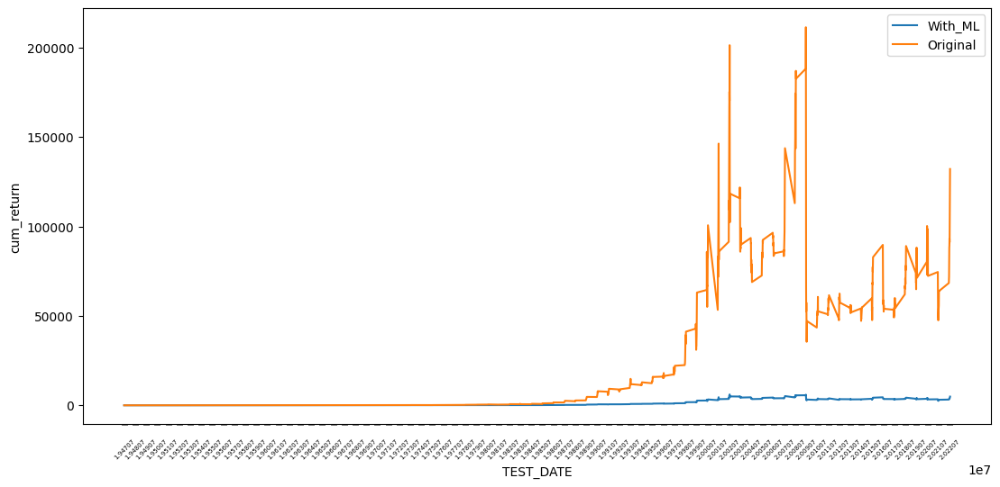

In [25]:
cum_return_sharpe_ratio(data=Fixed_RDF_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.23      0.28       316
         1.0       0.65      0.77      0.71       590

    accuracy                           0.58       906
   macro avg       0.50      0.50      0.49       906
weighted avg       0.55      0.58      0.56       906


accuracy : 0.5816777041942605

precision : 0.6509298998569385

recall : 0.7711864406779662

F1-Score : 0.7059736229635376



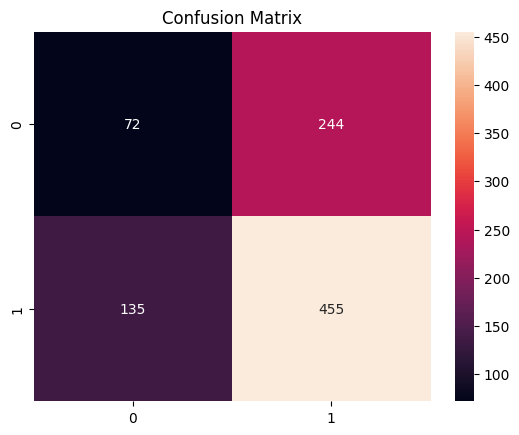


ACTUAL = PRED = 1



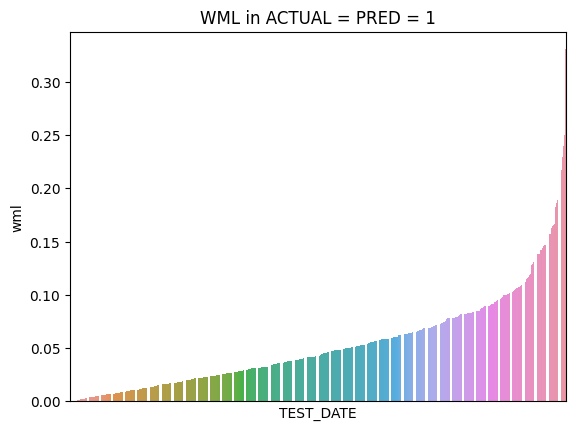

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,455.0,0.053468,0.002016,0.044902,0.000007,0.000908,0.021556,0.042778,0.073358,0.213285,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,455.0,0.037639,0.000994,0.031535,0.000004,0.000578,0.014439,0.029796,0.053983,0.14334,0.225197



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



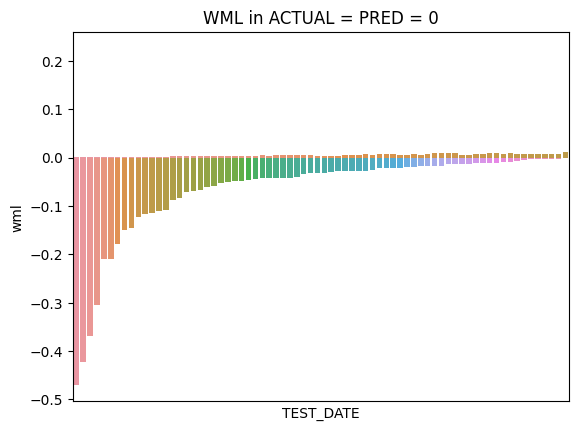

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,72.0,-0.065973,0.00878,0.093701,-0.469903,-0.436176,-0.067973,-0.032352,-0.015992,-0.002218,-0.001641


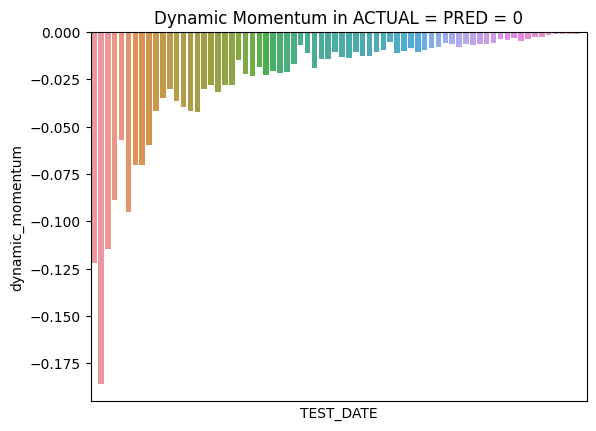

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,72.0,-0.024674,0.001041,0.032264,-0.185856,-0.140642,-0.028717,-0.012836,-0.00649,-0.000897,-0.000722



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



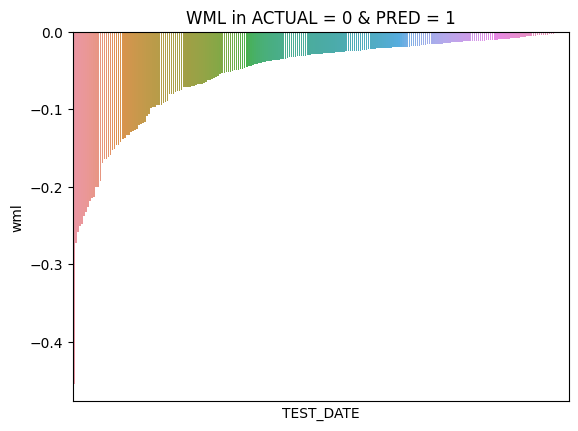

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,244.0,-0.05346,0.003977,0.063062,-0.454349,-0.254757,-0.067966,-0.028293,-0.01461,-0.0007,-0.000132


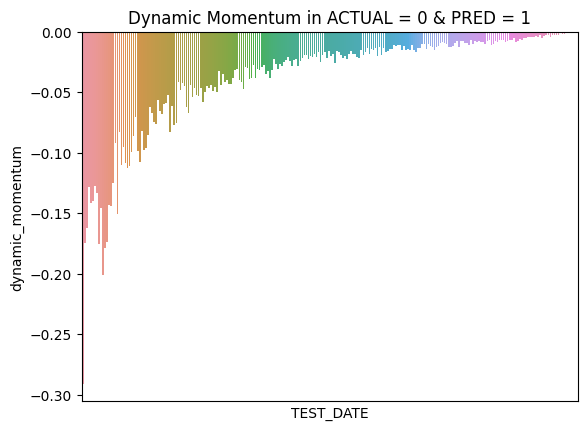

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,244.0,-0.037062,0.001889,0.043457,-0.290783,-0.176952,-0.045568,-0.019619,-0.009899,-0.000431,-0.000069



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



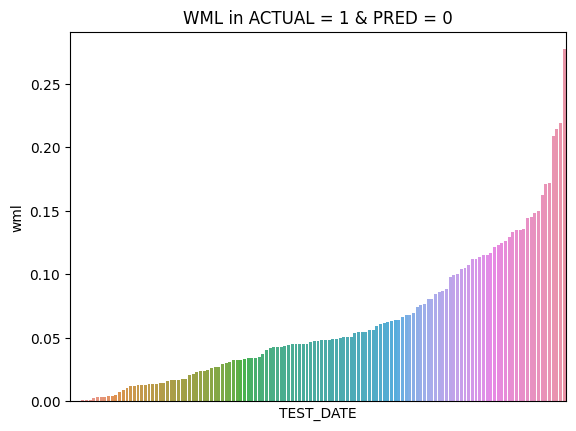

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,135.0,0.061256,0.002754,0.052476,0.000221,0.000649,0.022387,0.0479,0.086743,0.217314,0.276912


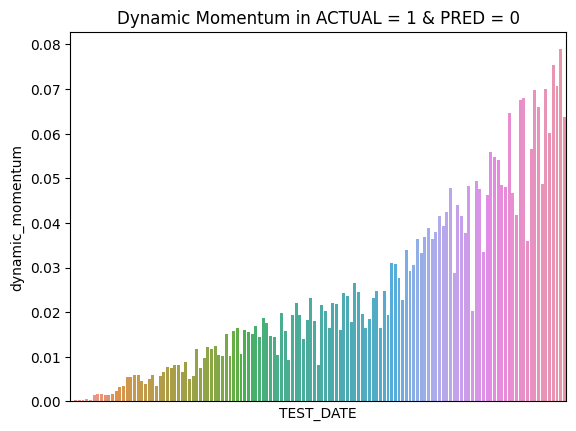

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,135.0,0.024207,0.000393,0.019817,0.000111,0.000269,0.008124,0.018431,0.036571,0.07368,0.078844


In [26]:
plot_predict_result(Fixed_RDF_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
19991231,19791231,19991130,0.239571,0.225197,1.0,0.94,1.0,0.225956,0.207687,0.168092,0.217748,0.180516,2625.384279
20000229,19800229,20000131,0.330163,0.188193,1.0,0.57,1.0,0.230069,0.197956,0.183551,0.217159,0.171264,3172.302961
20020430,19820430,20020328,0.210220,0.168176,1.0,0.80,1.0,0.210221,0.218963,0.172270,0.210393,0.188153,4662.806717
20020228,19820226,20020131,0.250175,0.160112,1.0,0.64,1.0,0.203090,0.212464,0.169978,0.217899,0.196569,4133.883894
19801128,19601130,19801031,0.186602,0.149281,1.0,0.80,1.0,0.213961,0.191625,0.179343,0.205943,0.209128,56.112469



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
20090430,19890428,20090331,-0.454349,-0.290783,0.0,0.64,1.0,0.204883,0.205297,0.188158,0.186931,0.214731,3419.187891
20120131,19920131,20111230,-0.213660,-0.200840,0.0,0.94,1.0,0.179490,0.210233,0.192318,0.194560,0.223398,3093.396225
20090331,19890331,20090227,-0.422400,-0.185856,0.0,0.44,0.0,0.199265,0.215507,0.195353,0.188177,0.201698,4821.487240
19750131,19550131,19741231,-0.200374,-0.178333,0.0,0.89,1.0,0.222091,0.197737,0.189266,0.197172,0.193733,19.808681
20210226,20010228,20210129,-0.218901,-0.175121,0.0,0.80,1.0,0.205678,0.205444,0.191150,0.203344,0.194384,2781.872785


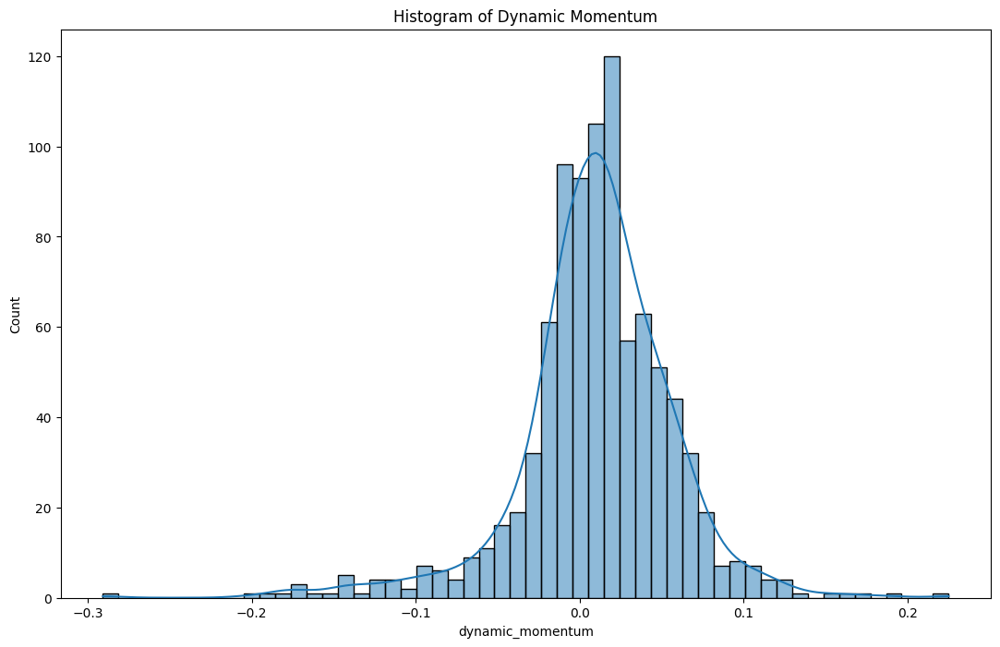

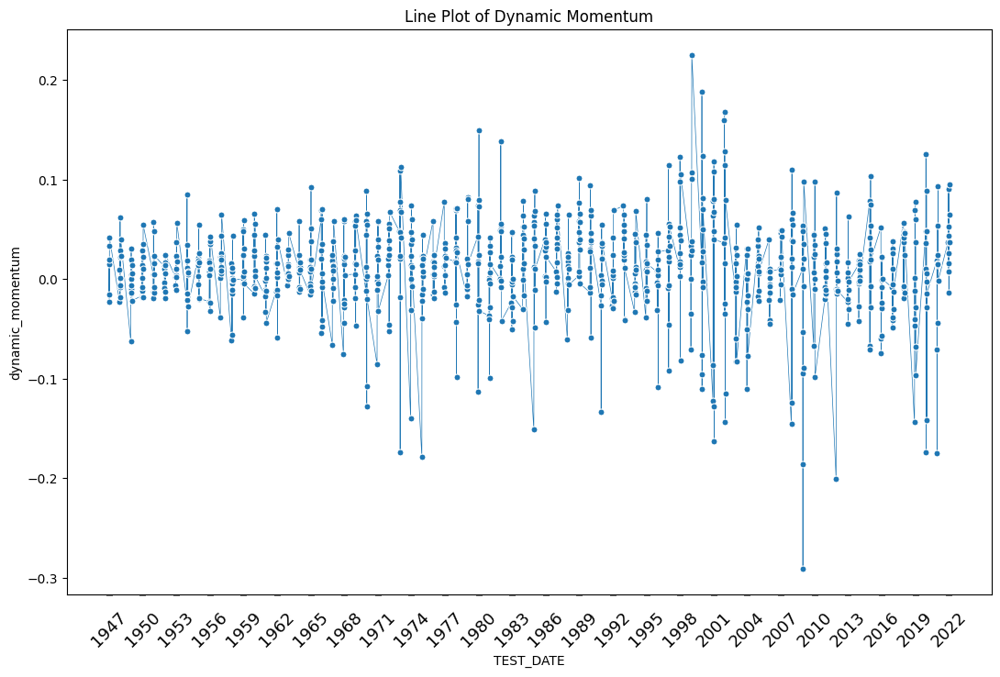

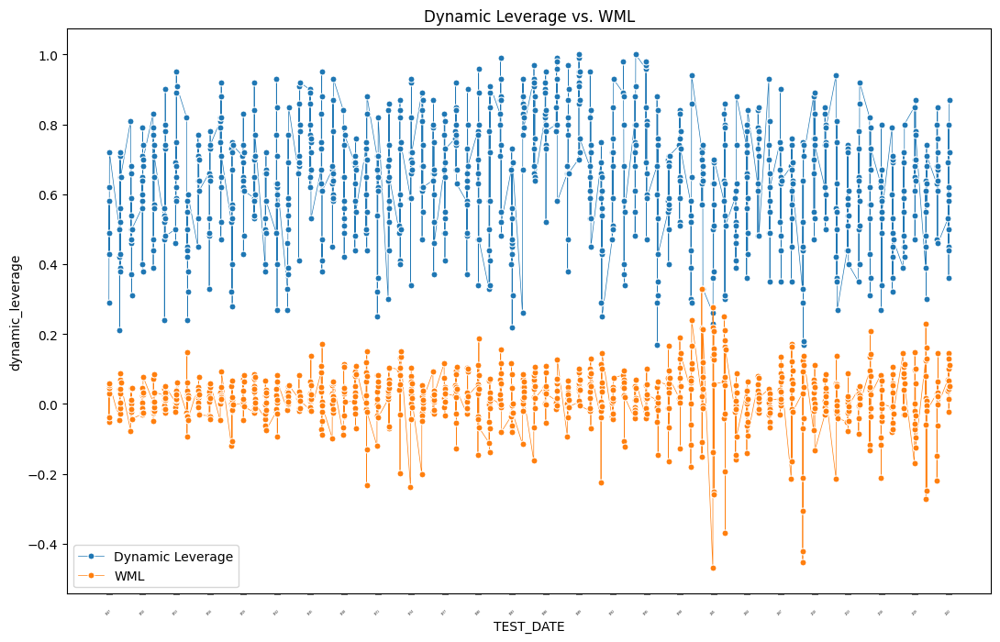

In [27]:
plot_dynamic_momentum(Fixed_RDF_Result)

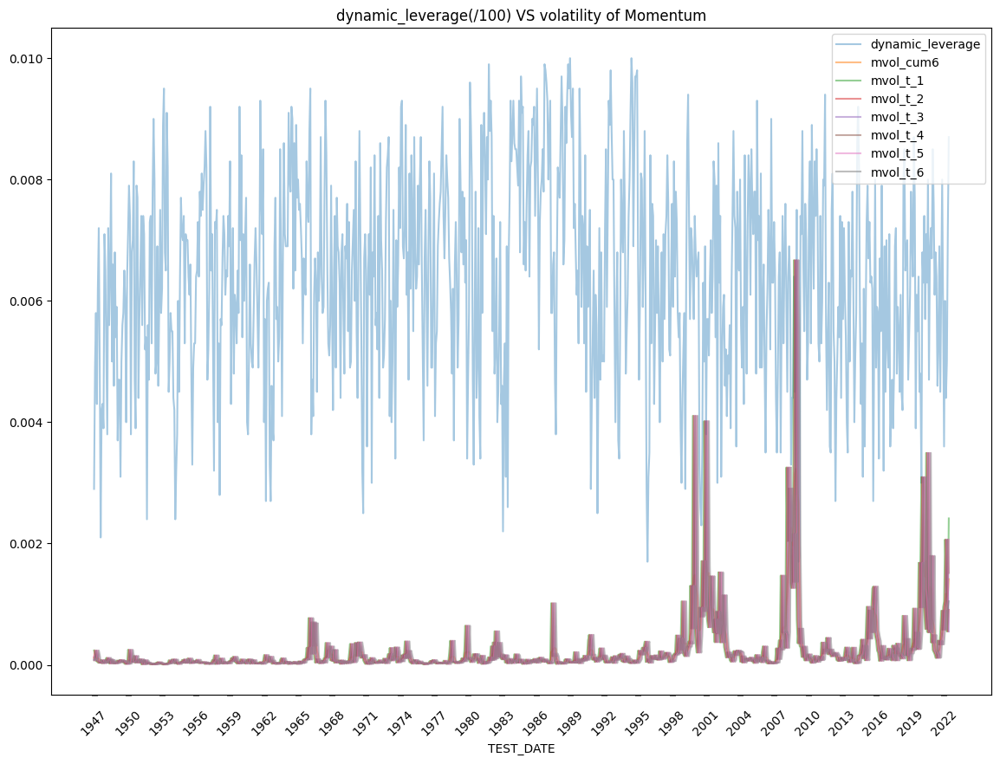

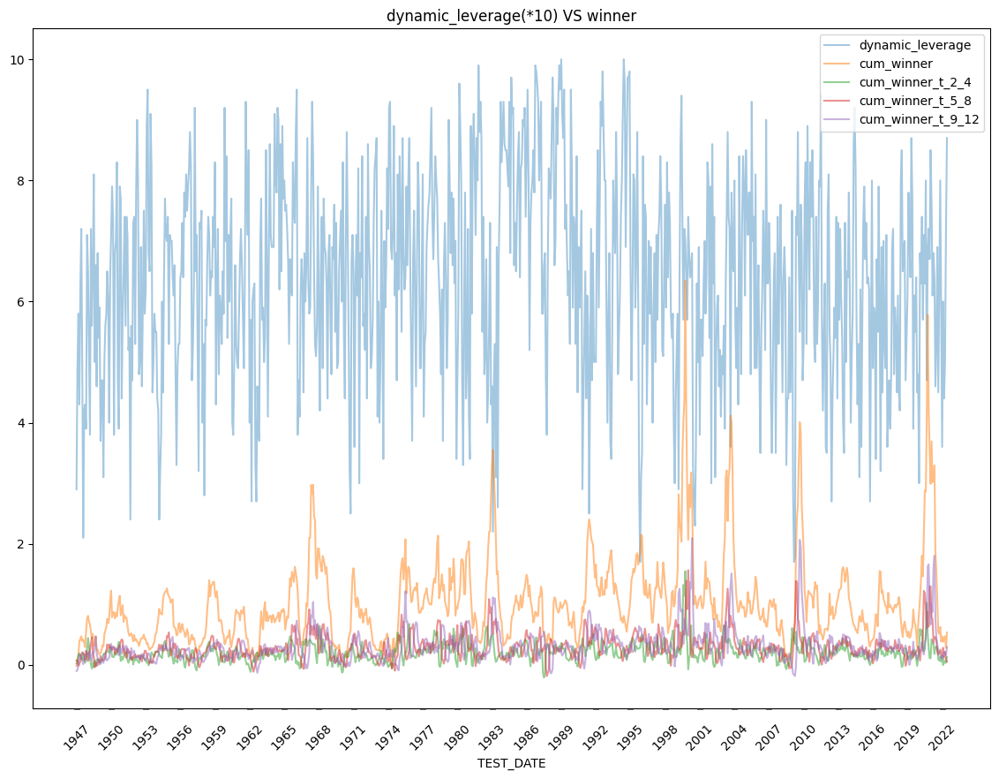

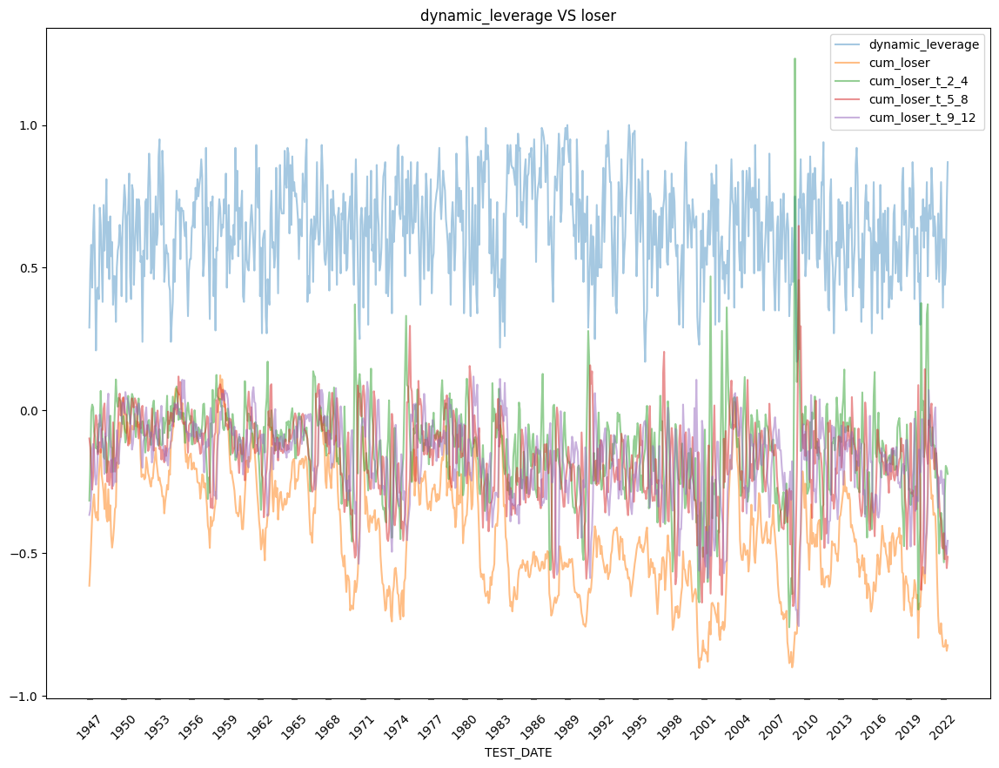

In [56]:
save_RDF = leverage_save(Fixed_RDF_Result, DATA)
save_RDF.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/RDF_{case_name}.csv')



Feature Importance of the model



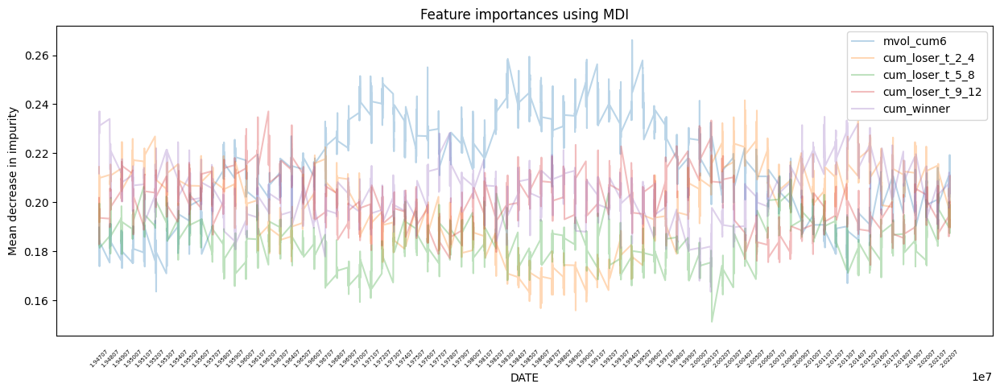

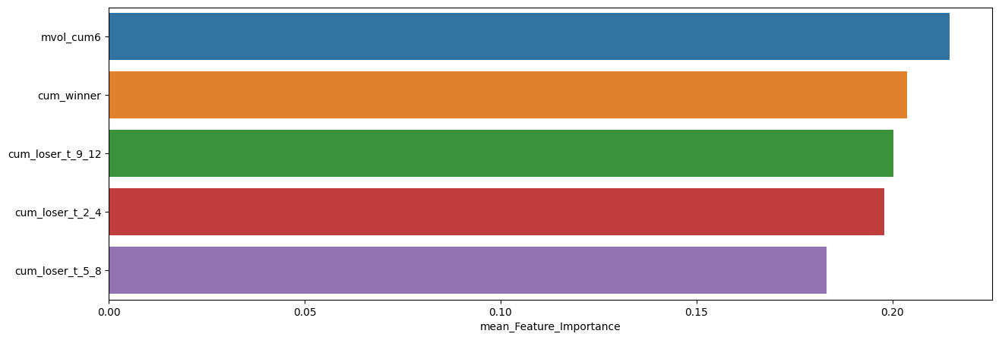

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.214716,0.266183,0.163522
cum_winner,0.203668,0.237078,0.163438
cum_loser_t_9_12,0.200362,0.237056,0.174415
cum_loser_t_2_4,0.197978,0.241598,0.155838
cum_loser_t_5_8,0.183276,0.210481,0.151211


In [29]:
plot_feature_importances(Fixed_RDF_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.25      0.29        75
         1.0       0.67      0.74      0.70       151

    accuracy                           0.58       226
   macro avg       0.50      0.50      0.49       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.5796460176991151

precision : 0.6666666666666666

recall : 0.7417218543046358

F1-Score : 0.702194357366771



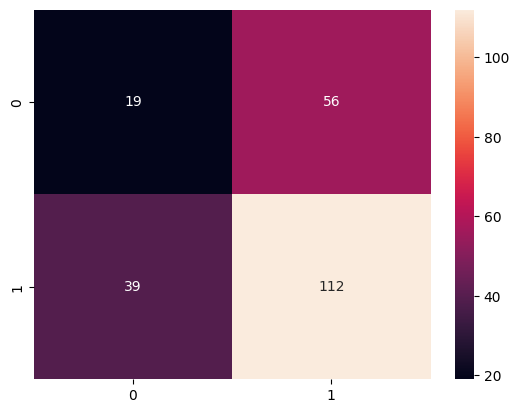


Feature Importance of the model



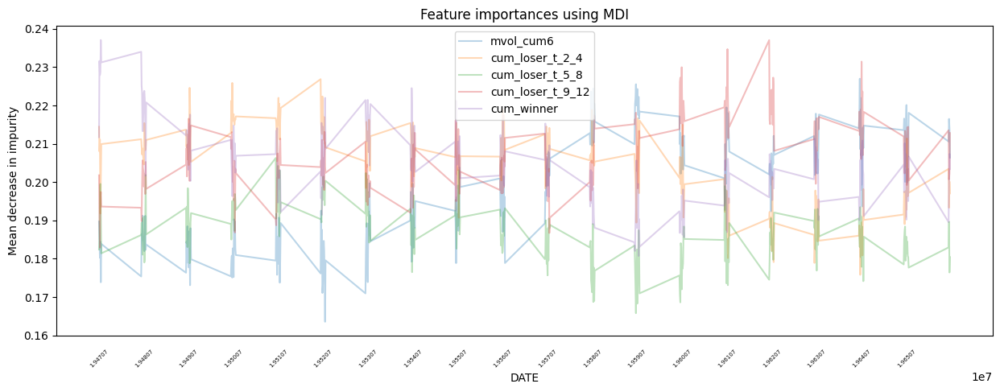

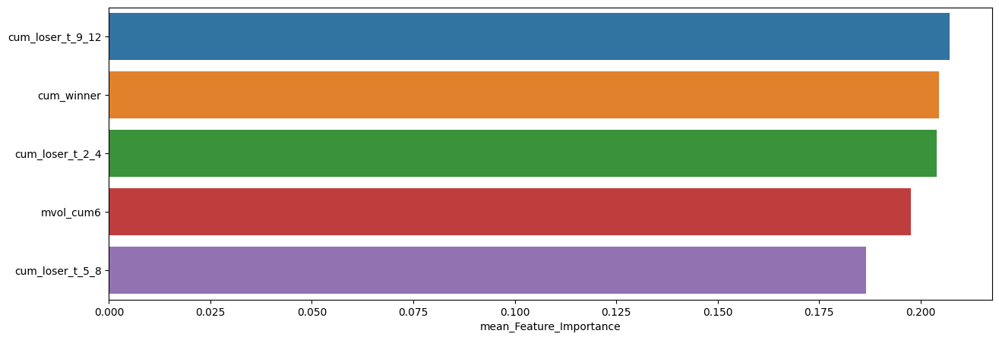

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.207264,0.237056,0.182884
cum_winner,0.204517,0.237078,0.180705
cum_loser_t_2_4,0.204049,0.226860,0.175782
mvol_cum6,0.197657,0.226982,0.163522
cum_loser_t_5_8,0.186513,0.206283,0.165760



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.21      0.26        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.60       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.60      0.57       226


accuracy : 0.6017699115044248

precision : 0.6703910614525139

recall : 0.7947019867549668

F1-Score : 0.7272727272727273



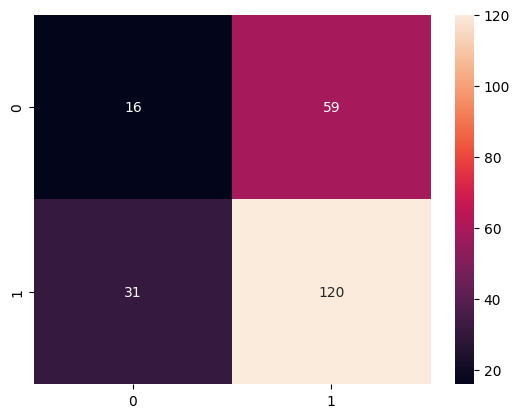


Feature Importance of the model



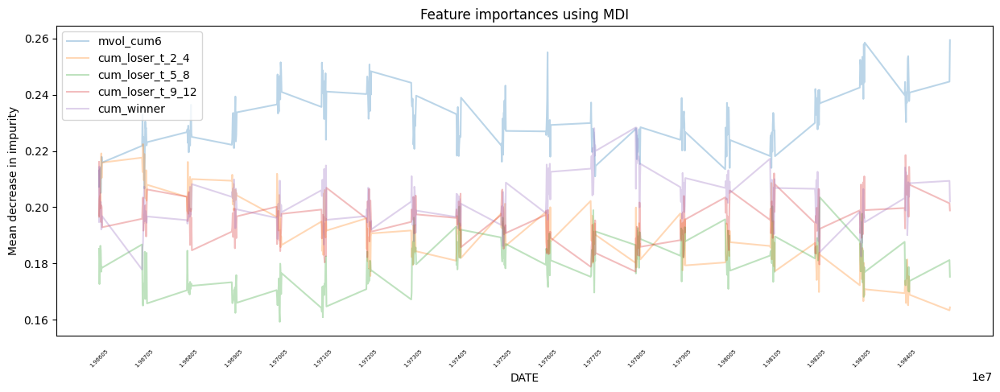

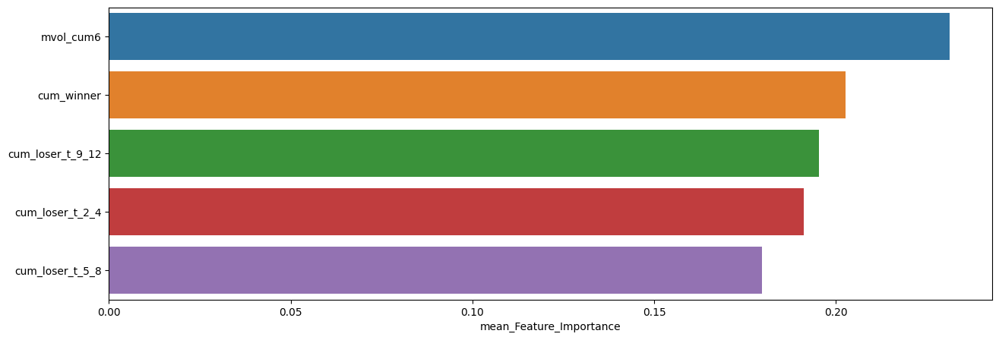

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.231355,0.259408,0.205081
cum_winner,0.202605,0.228320,0.177842
cum_loser_t_9_12,0.195253,0.218543,0.177122
cum_loser_t_2_4,0.191049,0.222441,0.163356
cum_loser_t_5_8,0.179737,0.203506,0.159266



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.23      0.29        70
         1.0       0.71      0.85      0.78       156

    accuracy                           0.66       226
   macro avg       0.56      0.54      0.53       226
weighted avg       0.62      0.66      0.63       226


accuracy : 0.6592920353982301

precision : 0.7112299465240641

recall : 0.8525641025641025

F1-Score : 0.7755102040816327



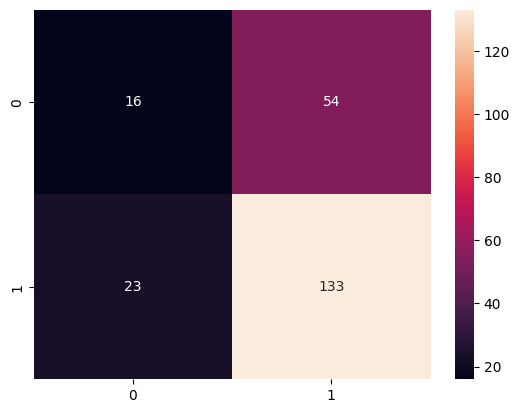


Feature Importance of the model



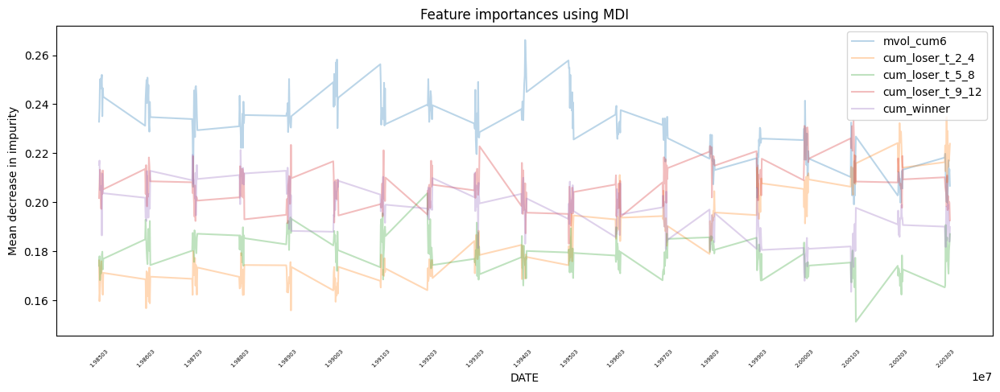

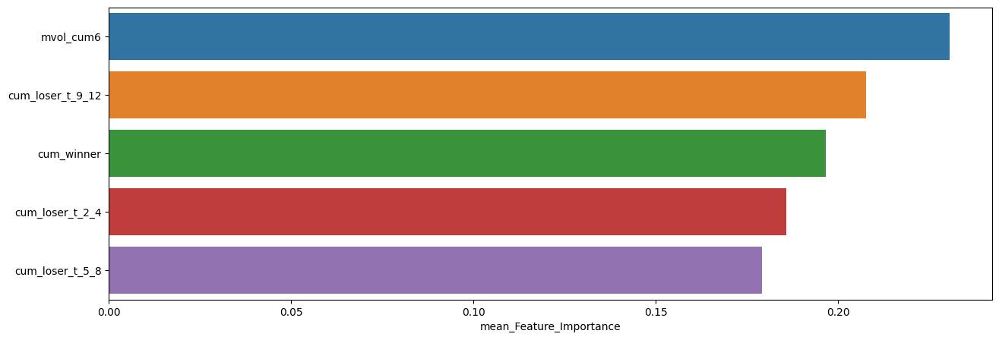

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.230675,0.266183,0.199094
cum_loser_t_9_12,0.207702,0.233380,0.183033
cum_winner,0.196611,0.221278,0.163438
cum_loser_t_2_4,0.185853,0.234684,0.155838
cum_loser_t_5_8,0.179159,0.203661,0.151211



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.22      0.26        96
         1.0       0.55      0.68      0.61       132

    accuracy                           0.49       228
   macro avg       0.44      0.45      0.44       228
weighted avg       0.46      0.49      0.46       228


accuracy : 0.4868421052631579

precision : 0.5454545454545454

recall : 0.6818181818181818

F1-Score : 0.6060606060606061



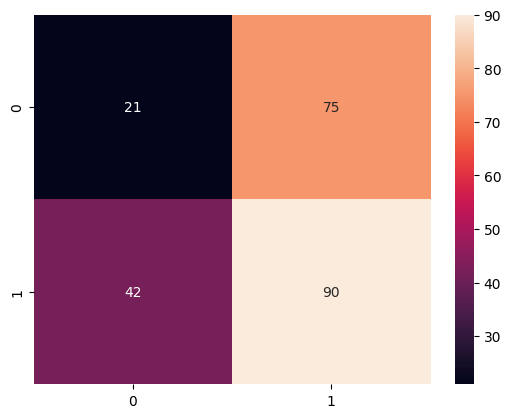


Feature Importance of the model



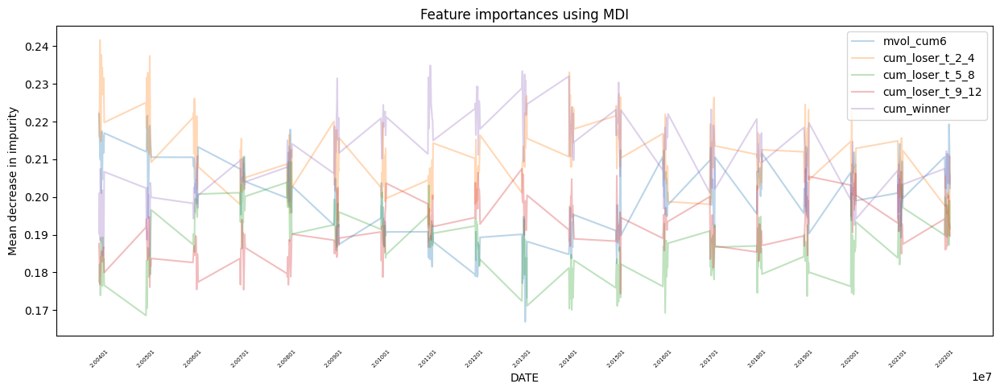

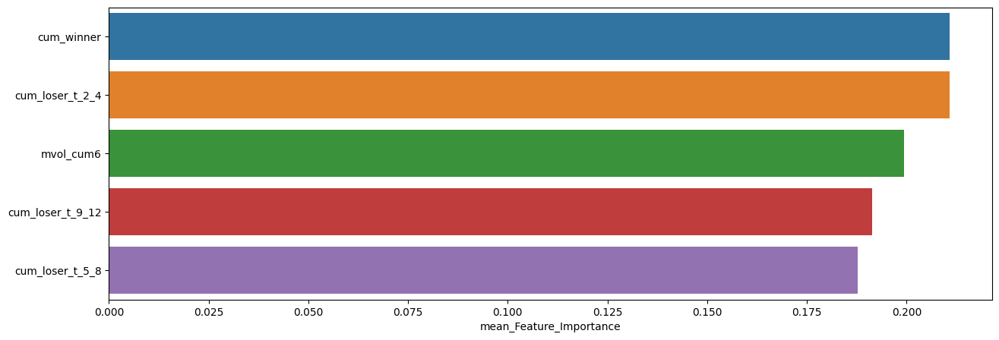

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.210877,0.234895,0.184264
cum_loser_t_2_4,0.210847,0.241598,0.189765
mvol_cum6,0.199312,0.222060,0.166911
cum_loser_t_9_12,0.191309,0.207500,0.174415
cum_loser_t_5_8,0.187655,0.210481,0.168598


In [30]:
slice_feature_importance(Fixed_RDF_Result, 4)

## Grdient Boosting

In [31]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

In [32]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.7683591110261484


최근 누적 수익률

  2022년-12월 -> 5668.54
  2022년-11월 -> 5272.30
  2022년-10월 -> 5040.23
  2022년-09월 -> 4970.24
  2022년-08월 -> 4943.21

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 7030.94
  2등 : 2009년-02월 -> 6609.18
  3등 : 2009년-01월 -> 6513.47
  4등 : 2008년-11월 -> 6492.64
  5등 : 2008년-12월 -> 6411.63
  6등 : 2002년-07월 -> 6400.83
  7등 : 2003년-02월 -> 6277.18
  8등 : 2002년-06월 -> 6267.87
  9등 : 2002년-08월 -> 6244.04
  10등 : 2003년-03월 -> 6237.37



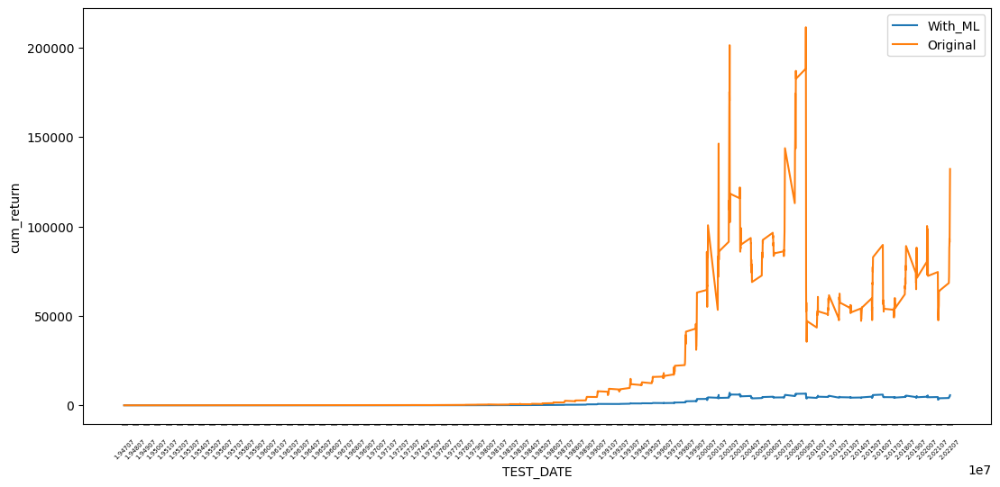

In [33]:
cum_return_sharpe_ratio(data=Fixed_GBC_Result, dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.22      0.26       316
         1.0       0.65      0.78      0.71       590

    accuracy                           0.58       906
   macro avg       0.49      0.50      0.49       906
weighted avg       0.54      0.58      0.55       906


accuracy : 0.5805739514348786

precision : 0.6487252124645893

recall : 0.7762711864406779

F1-Score : 0.7067901234567902



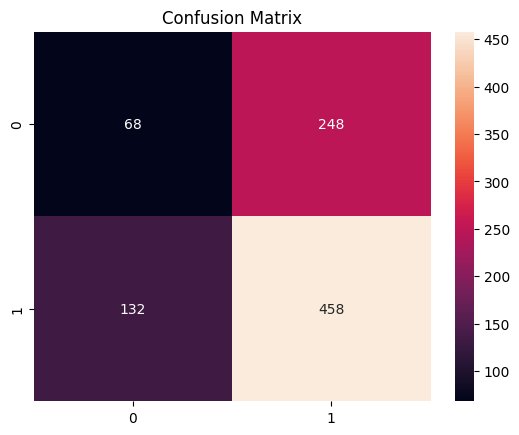


ACTUAL = PRED = 1



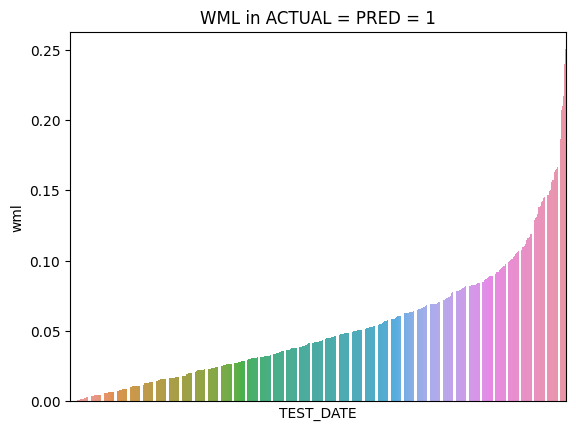

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,458.0,0.051868,0.001767,0.042038,0.000007,0.00064,0.021049,0.042303,0.071958,0.195532,0.250175


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,458.0,0.039593,0.001069,0.032694,0.000005,0.000462,0.015318,0.031904,0.056896,0.148819,0.226044



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



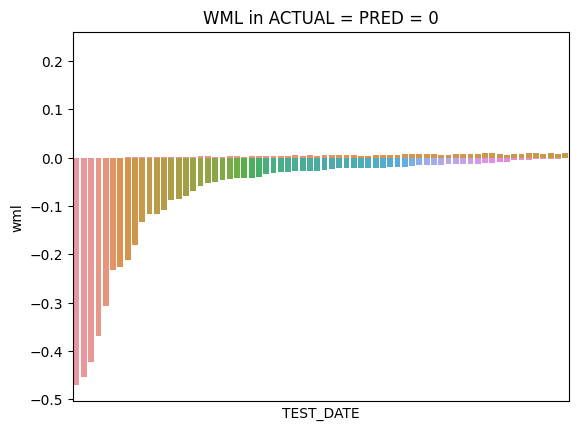

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,68.0,-0.070282,0.011924,0.109199,-0.469903,-0.459482,-0.061089,-0.026193,-0.01413,-0.001266,-0.000506


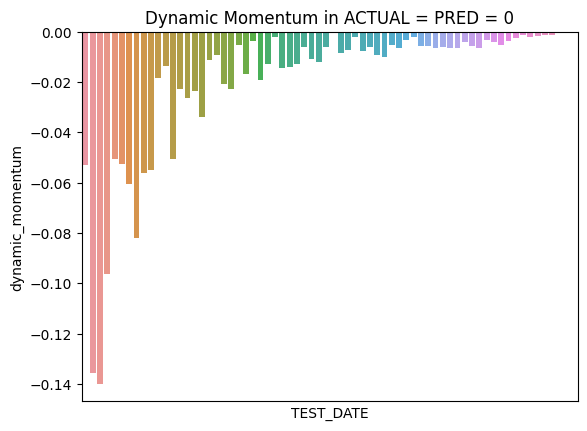

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,68.0,-0.019353,0.000839,0.028967,-0.139913,-0.136985,-0.019461,-0.006939,-0.003888,-0.000154,-0.000062



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



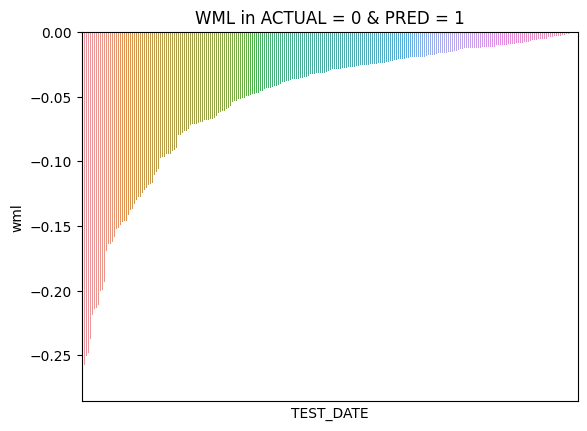

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,248.0,-0.05248,0.003168,0.056289,-0.271971,-0.249494,-0.067966,-0.030187,-0.015243,-0.001012,-0.000132


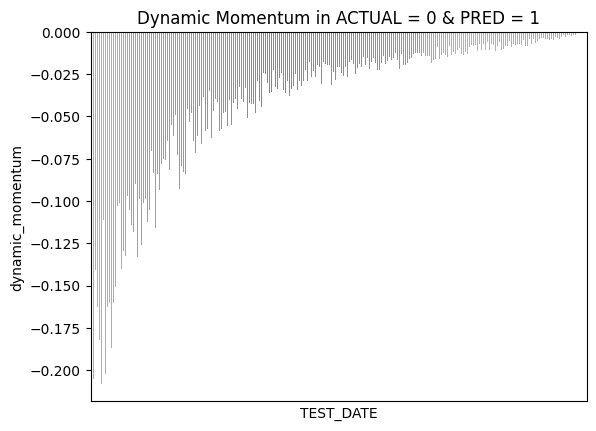

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,248.0,-0.039308,0.001875,0.043296,-0.208152,-0.195329,-0.04798,-0.021582,-0.011461,-0.000824,-0.000094



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



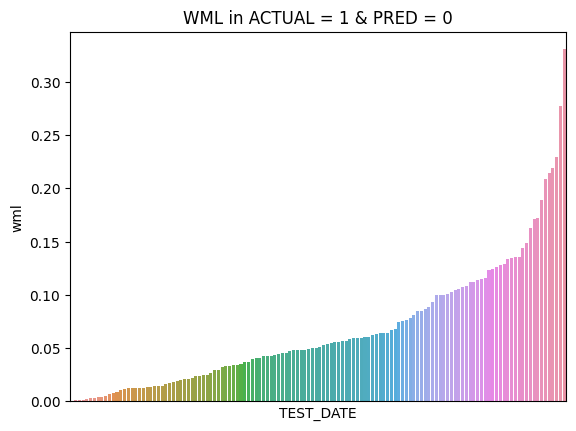

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,132.0,0.066983,0.003509,0.059235,0.000692,0.001226,0.023215,0.050649,0.099786,0.262099,0.330163


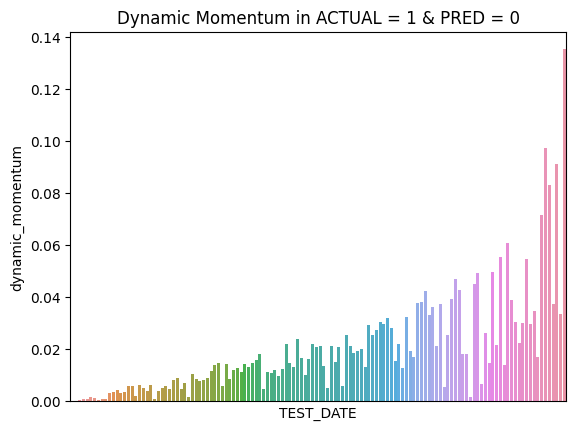

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,132.0,0.020479,0.000427,0.020654,0.000162,0.000295,0.006187,0.014699,0.027587,0.095409,0.135374


In [34]:
plot_predict_result(Fixed_GBC_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
19991231,19791231,19991130,0.239571,0.226044,1.0,0.943535,1.0,0.211066,0.191462,0.192501,0.224270,0.180701,3527.625870
19801128,19601130,19801031,0.186602,0.173508,1.0,0.929833,1.0,0.212389,0.130889,0.218981,0.187596,0.250145,74.191602
20020430,19820430,20020328,0.210220,0.158445,1.0,0.753711,1.0,0.185272,0.242295,0.137374,0.250347,0.184712,5378.411696
20000630,19800630,20000531,0.216883,0.154193,1.0,0.710949,1.0,0.219567,0.202742,0.153968,0.260533,0.163189,3388.635583
19820630,19620629,19820528,0.157135,0.149630,1.0,0.952244,1.0,0.269389,0.138097,0.209214,0.194920,0.188380,82.234644



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
20210226,20010228,20210129,-0.218901,-0.208152,0.0,0.950896,1.0,0.166352,0.220944,0.098671,0.306931,0.207102,3658.714632
20011130,19811130,20011031,-0.257774,-0.205060,0.0,0.795502,1.0,0.209443,0.205373,0.148379,0.267598,0.169207,3940.027319
20120131,19920131,20111230,-0.213660,-0.202527,0.0,0.947895,1.0,0.143839,0.239043,0.181722,0.230991,0.204406,4243.936549
19730731,19530731,19730629,-0.199836,-0.187212,0.0,0.936825,1.0,0.340110,0.145369,0.143198,0.192259,0.179064,22.242655
19740131,19540129,19731231,-0.237095,-0.182472,0.0,0.769614,1.0,0.339216,0.129061,0.136120,0.208064,0.187540,21.287560


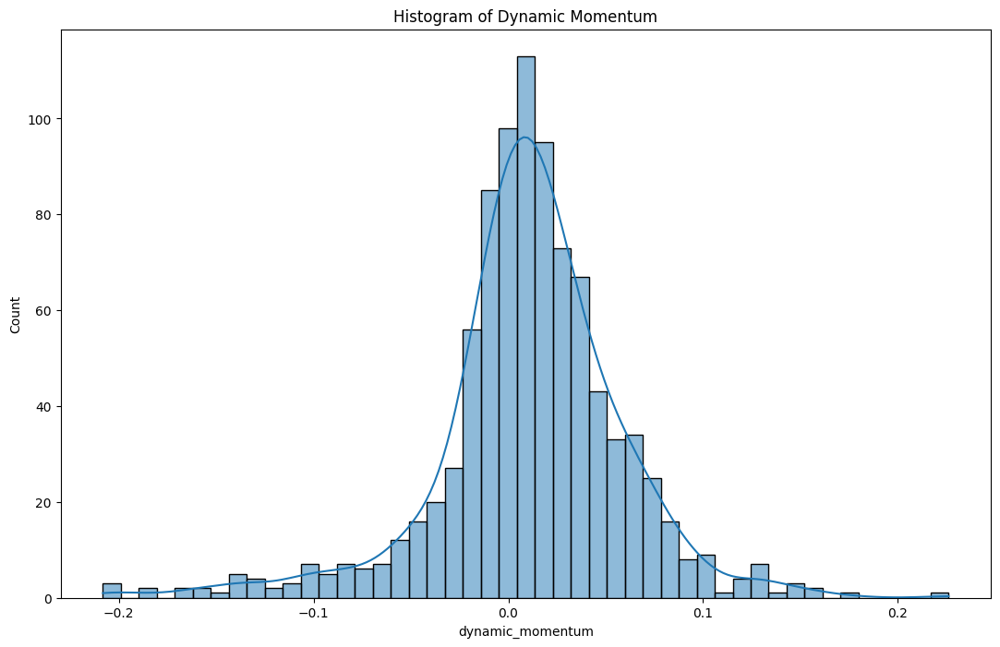

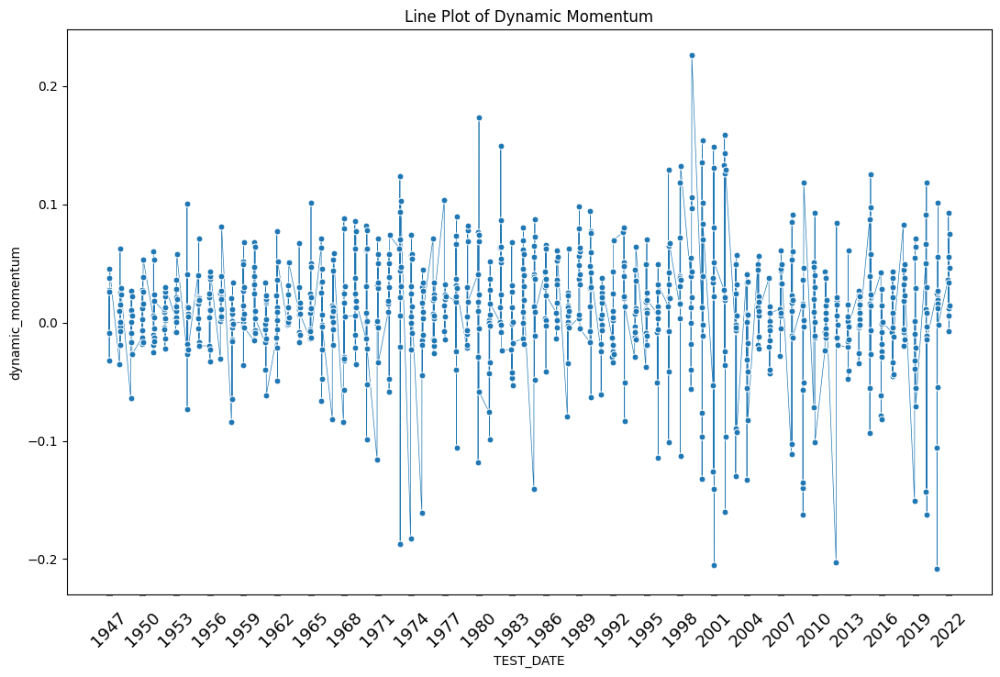

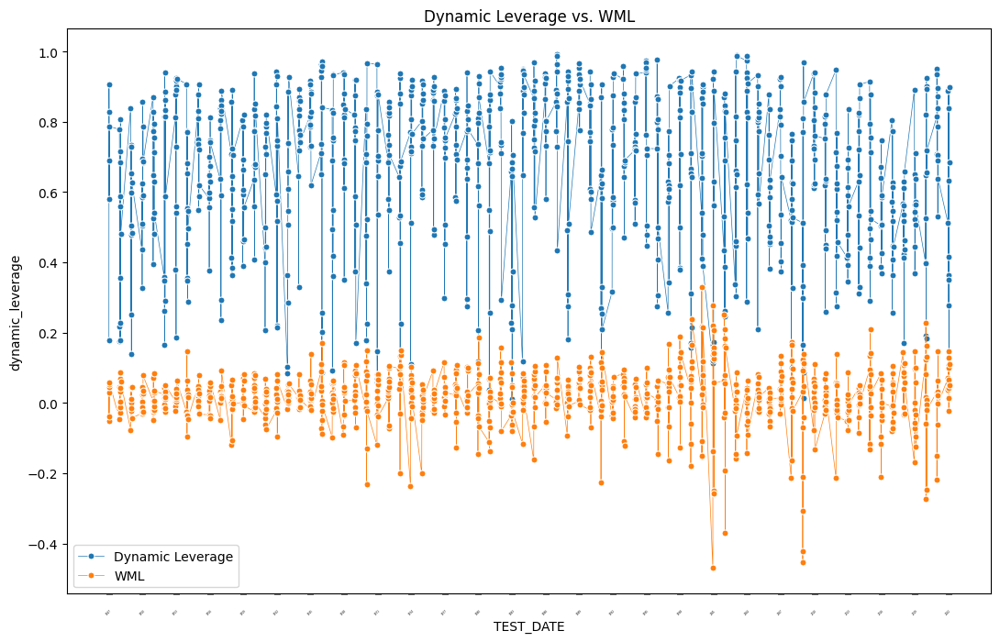

In [35]:
plot_dynamic_momentum(Fixed_GBC_Result)

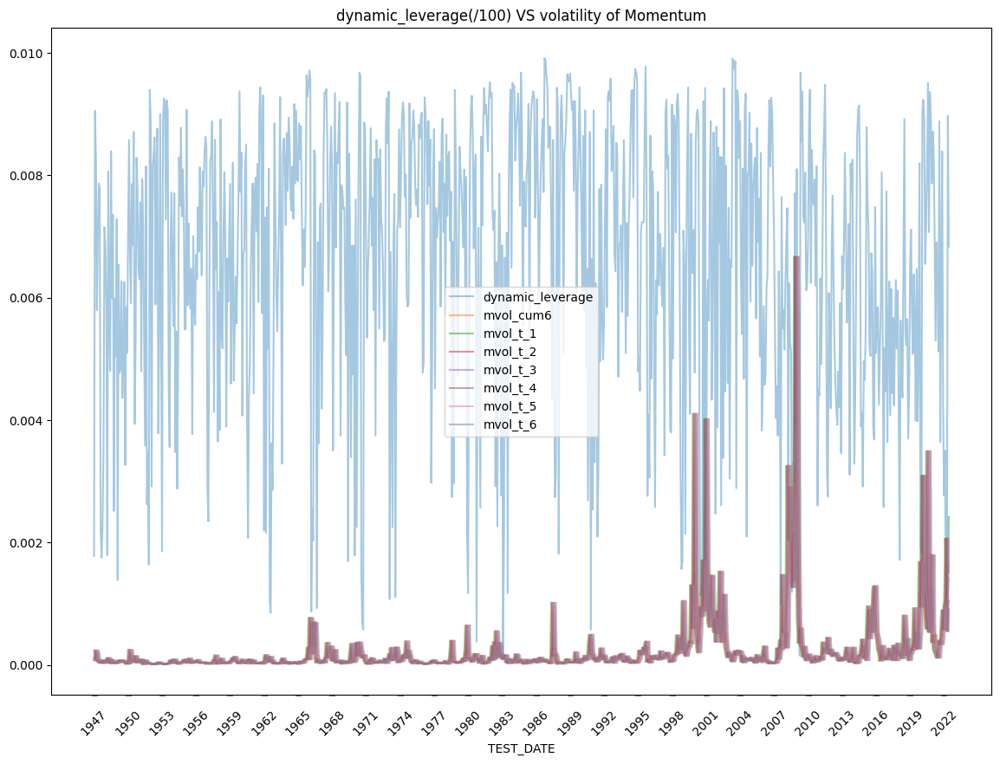

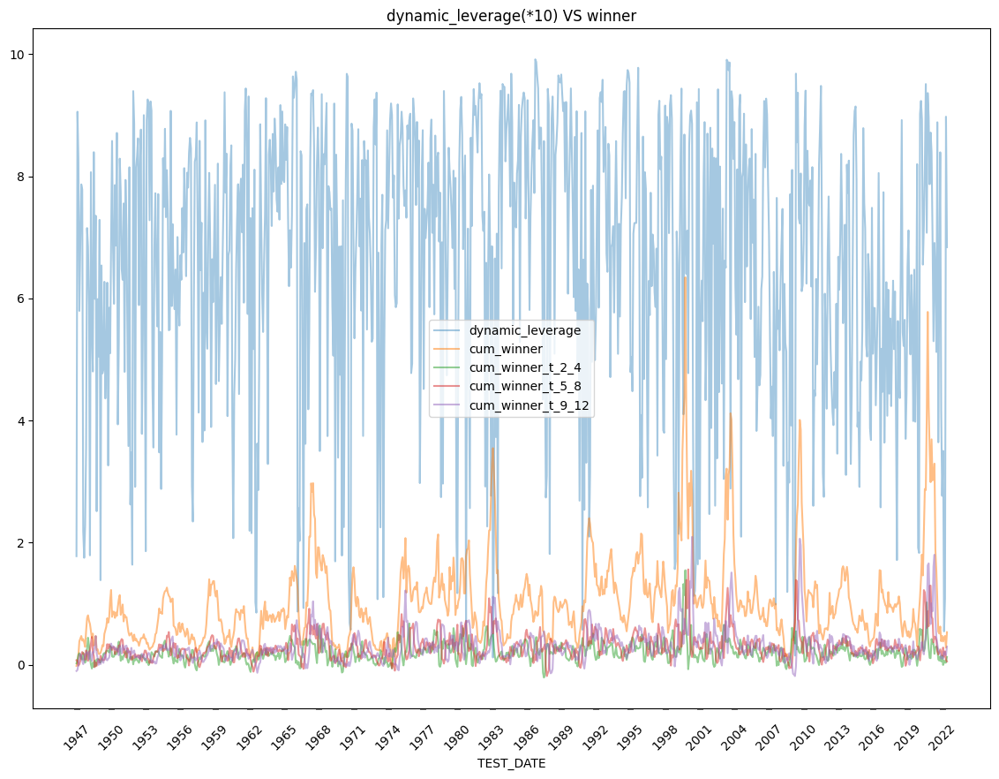

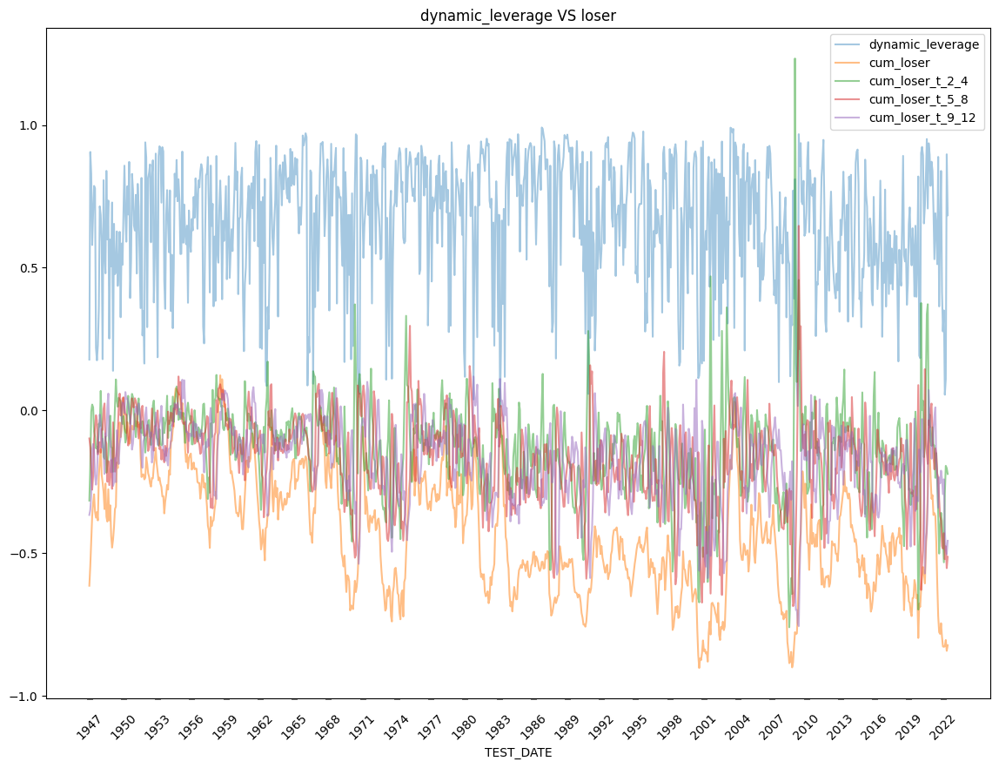

In [57]:
save_GBC = leverage_save(Fixed_GBC_Result, DATA)
save_GBC.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/GBC_{case_name}.csv')



Feature Importance of the model



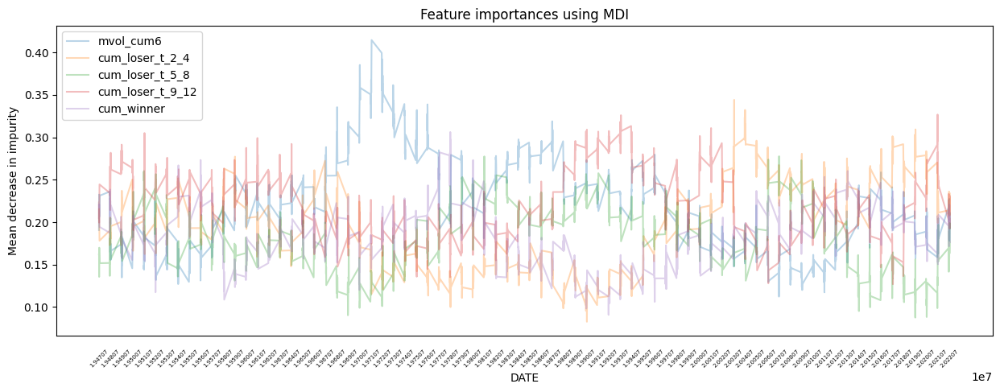

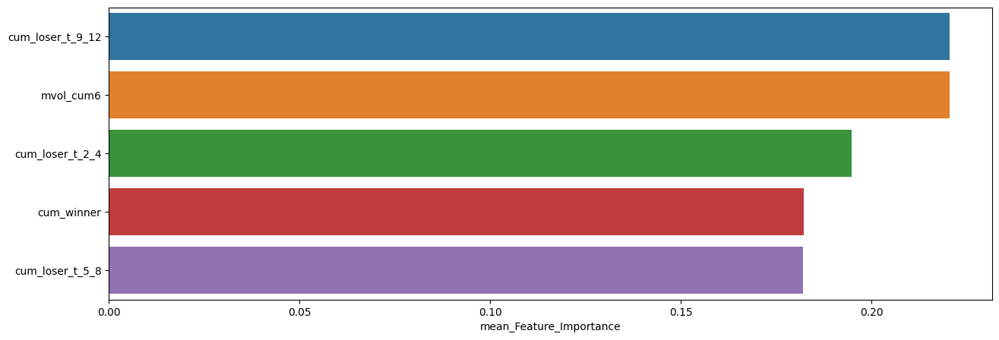

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.220596,0.326829,0.126932
mvol_cum6,0.220425,0.414598,0.112281
cum_loser_t_2_4,0.194752,0.344175,0.082661
cum_winner,0.182276,0.306224,0.090822
cum_loser_t_5_8,0.181951,0.277710,0.087605


In [37]:
plot_feature_importances(Fixed_GBC_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.23      0.28        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.61       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.57      0.61      0.58       226


accuracy : 0.6061946902654868

precision : 0.6741573033707865

recall : 0.7947019867549668

F1-Score : 0.729483282674772



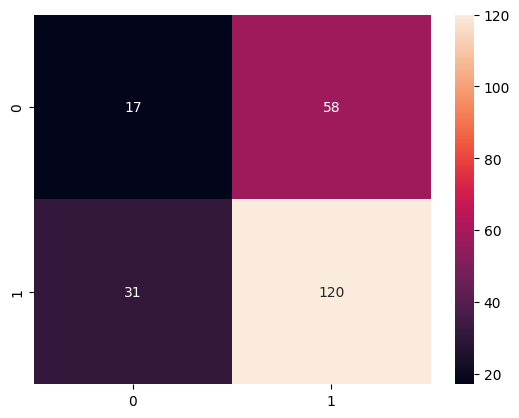


Feature Importance of the model



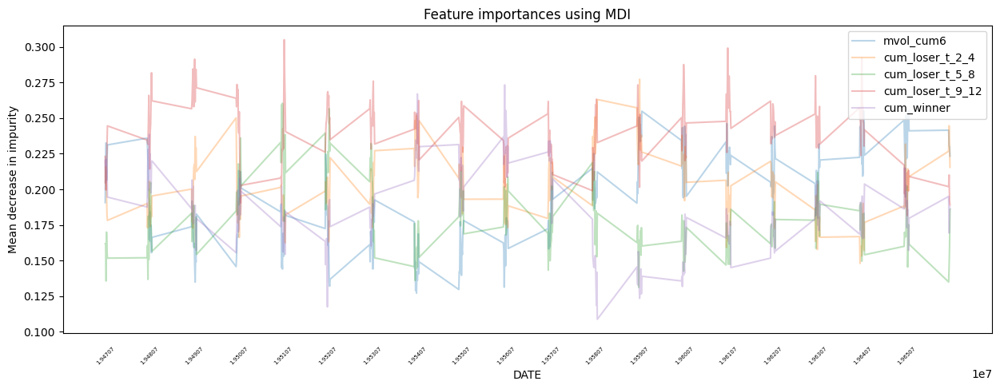

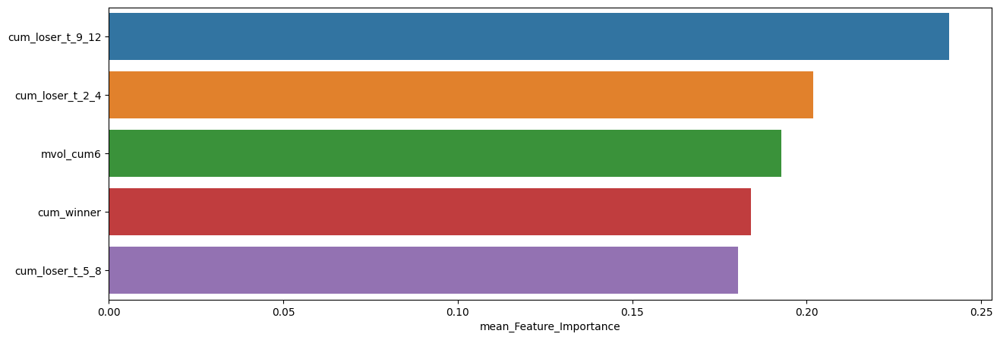

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.240956,0.304991,0.181554
cum_loser_t_2_4,0.201859,0.277249,0.147938
mvol_cum6,0.192757,0.255420,0.127066
cum_winner,0.184118,0.273263,0.108724
cum_loser_t_5_8,0.180309,0.260343,0.131080



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.23      0.29        75
         1.0       0.69      0.84      0.76       151

    accuracy                           0.64       226
   macro avg       0.55      0.53      0.52       226
weighted avg       0.60      0.64      0.60       226


accuracy : 0.6371681415929203

precision : 0.6864864864864865

recall : 0.8410596026490066

F1-Score : 0.7559523809523809



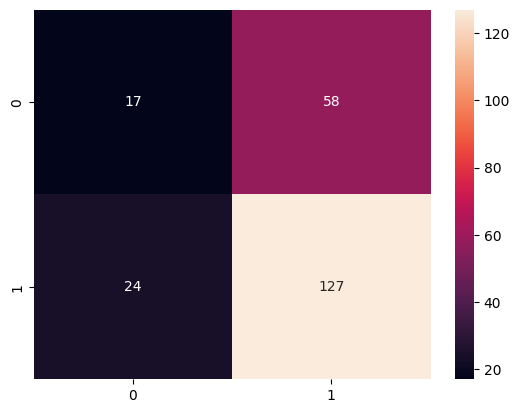


Feature Importance of the model



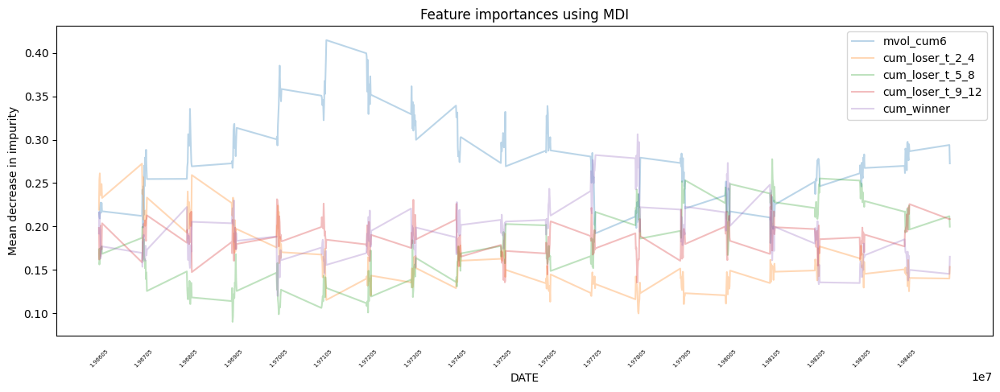

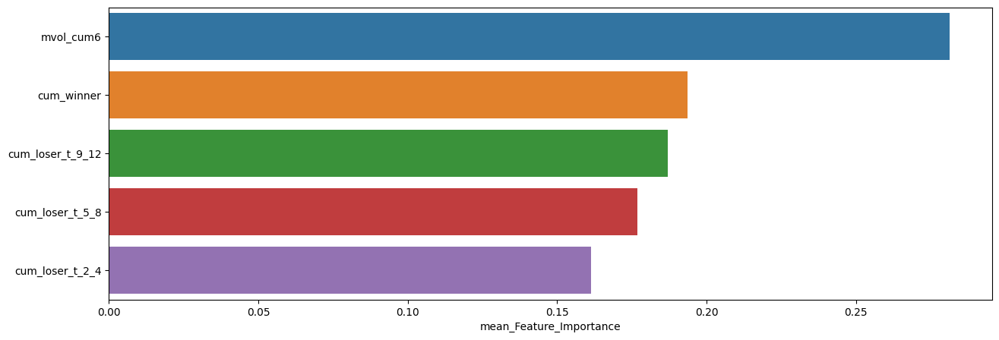

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.281406,0.414598,0.181028
cum_winner,0.193532,0.306224,0.120163
cum_loser_t_9_12,0.186923,0.236207,0.135274
cum_loser_t_5_8,0.176822,0.277492,0.090309
cum_loser_t_2_4,0.161317,0.272332,0.099970



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.30      0.20      0.24        70
         1.0       0.69      0.79      0.74       156

    accuracy                           0.61       226
   macro avg       0.50      0.50      0.49       226
weighted avg       0.57      0.61      0.58       226


accuracy : 0.6106194690265486

precision : 0.6888888888888889

recall : 0.7948717948717948

F1-Score : 0.738095238095238



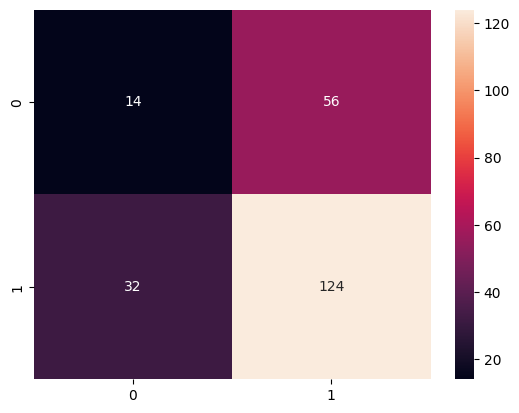


Feature Importance of the model



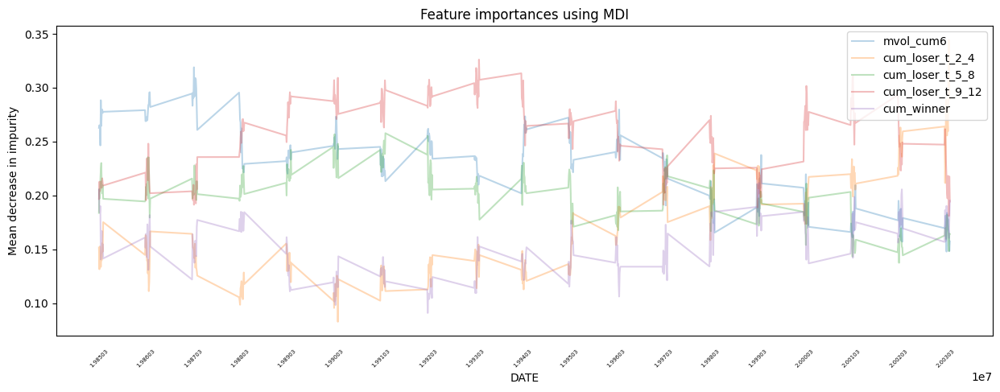

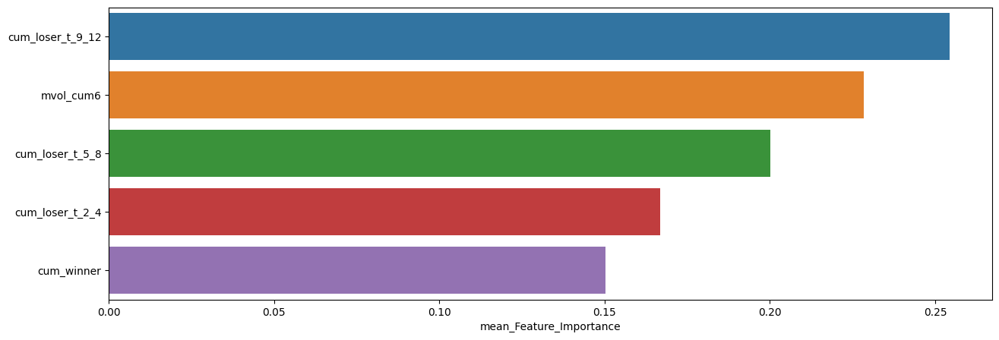

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.254488,0.326051,0.180836
mvol_cum6,0.228377,0.318862,0.147800
cum_loser_t_5_8,0.200181,0.257708,0.137374
cum_loser_t_2_4,0.166732,0.344175,0.082661
cum_winner,0.150223,0.211524,0.090822



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.21      0.25        96
         1.0       0.53      0.66      0.59       132

    accuracy                           0.47       228
   macro avg       0.42      0.43      0.42       228
weighted avg       0.44      0.47      0.45       228


accuracy : 0.4692982456140351

precision : 0.5337423312883436

recall : 0.6590909090909091

F1-Score : 0.5898305084745763



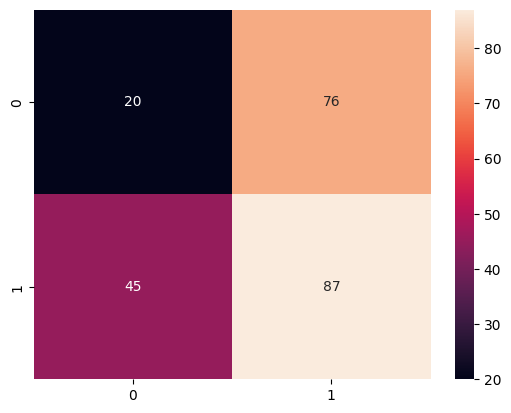


Feature Importance of the model



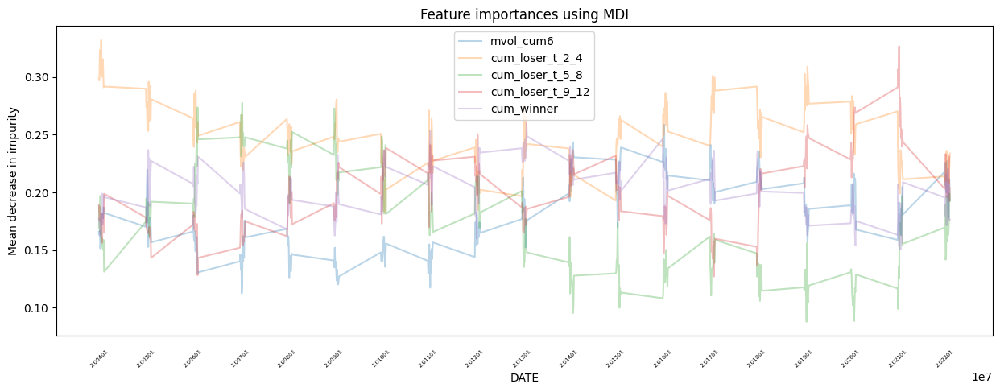

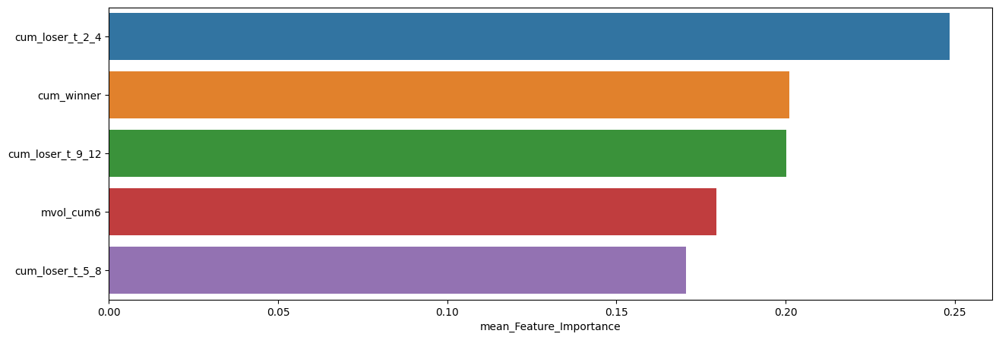

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,0.248623,0.332218,0.181976
cum_winner,0.201064,0.260294,0.150452
cum_loser_t_9_12,0.200196,0.326829,0.126932
mvol_cum6,0.179524,0.258761,0.112281
cum_loser_t_5_8,0.170592,0.277710,0.087605


In [38]:
slice_feature_importance(Fixed_GBC_Result, 4)

## XGB

In [39]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

In [40]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
   tree_method : None
   validate_paramete

  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.6788041131528645


최근 누적 수익률

  2022년-12월 -> 4506.50
  2022년-11월 -> 4076.45
  2022년-10월 -> 3881.34
  2022년-09월 -> 3742.56
  2022년-08월 -> 3716.73

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 12256.20
  2등 : 2002년-07월 -> 12070.81
  3등 : 2002년-06월 -> 12044.55
  4등 : 2002년-08월 -> 11735.84
  5등 : 2009년-02월 -> 10674.15
  6등 : 2008년-06월 -> 10424.00
  7등 : 2002년-05월 -> 10360.85
  8등 : 2002년-10월 -> 10257.50
  9등 : 2002년-04월 -> 10252.64
  10등 : 2008년-11월 -> 10045.77



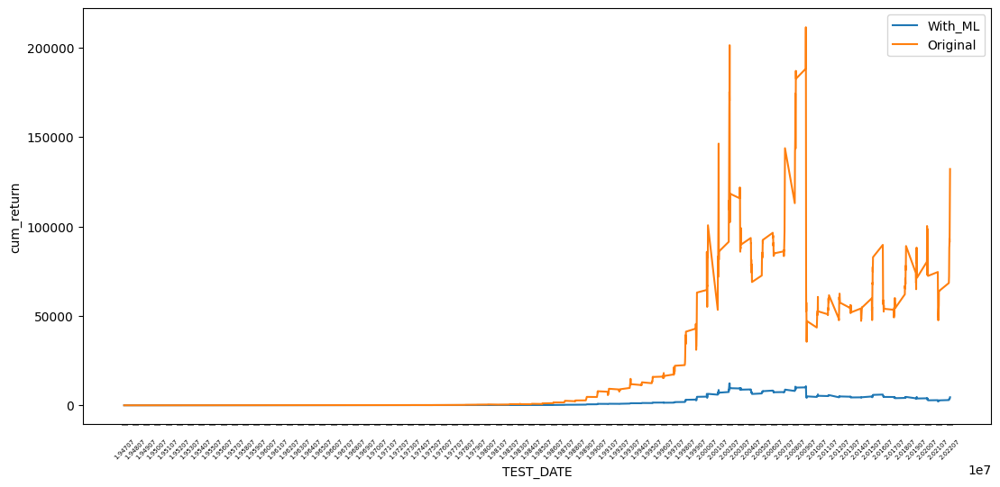

In [41]:
cum_return_sharpe_ratio(data=Fixed_XGB_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.26      0.29       316
         1.0       0.64      0.72      0.68       590

    accuracy                           0.56       906
   macro avg       0.49      0.49      0.48       906
weighted avg       0.53      0.56      0.54       906


accuracy : 0.5573951434878587

precision : 0.6438356164383562

recall : 0.7169491525423729

F1-Score : 0.6784282277465918



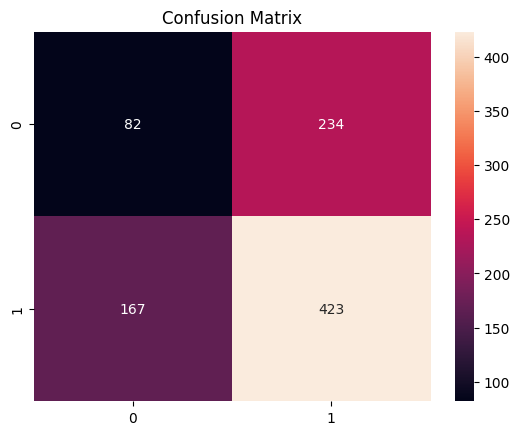


ACTUAL = PRED = 1



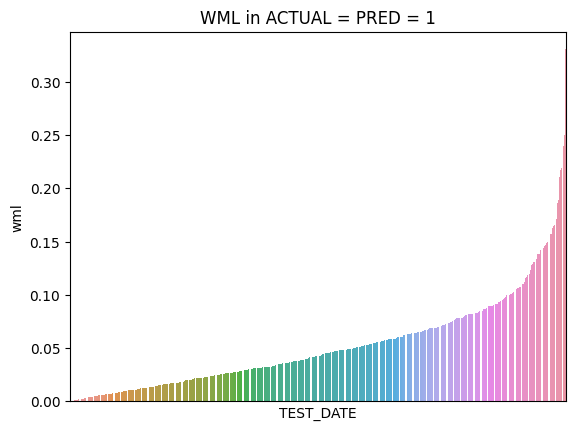

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,423.0,0.052715,0.001973,0.044423,0.000128,0.001406,0.021556,0.042778,0.071167,0.215417,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,423.0,0.046182,0.001647,0.040578,0.000122,0.001243,0.01762,0.03528,0.062585,0.18785,0.318754



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



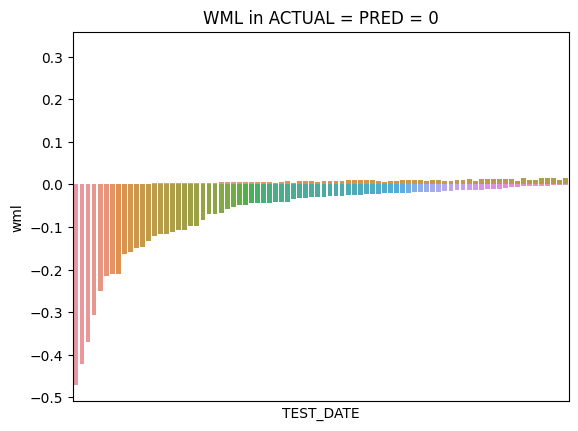

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,82.0,-0.068801,0.008761,0.093602,-0.469903,-0.431426,-0.093473,-0.028415,-0.016093,-0.002264,-0.001641


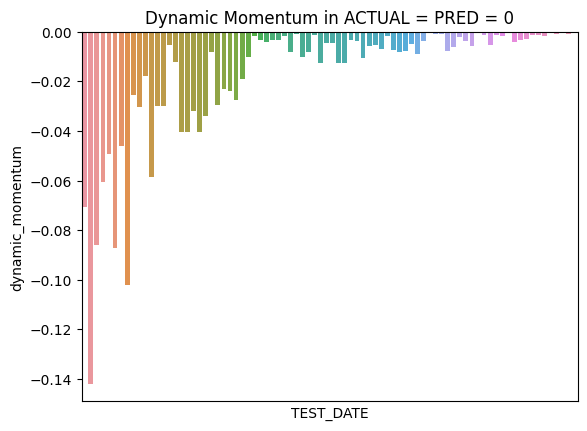

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,82.0,-0.017177,0.000666,0.025803,-0.142013,-0.109845,-0.023643,-0.006,-0.001911,-0.000333,-0.000242



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



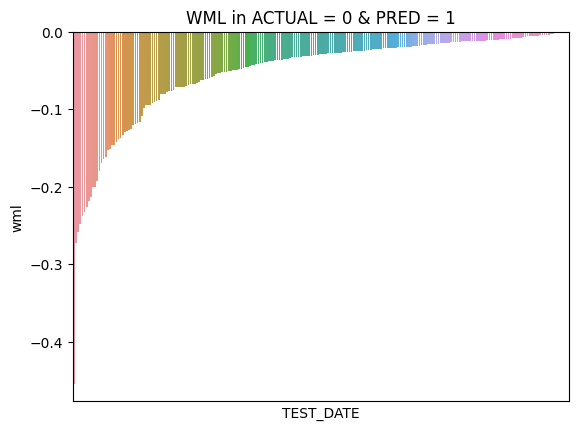

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,234.0,-0.051934,0.00374,0.061158,-0.454349,-0.254572,-0.066051,-0.02887,-0.014062,-0.000655,-0.000132


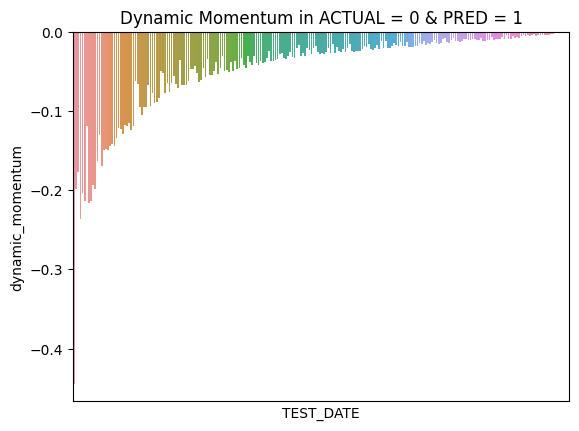

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,234.0,-0.045155,0.003076,0.05546,-0.444493,-0.215653,-0.051683,-0.025047,-0.012093,-0.00049,-0.000095



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



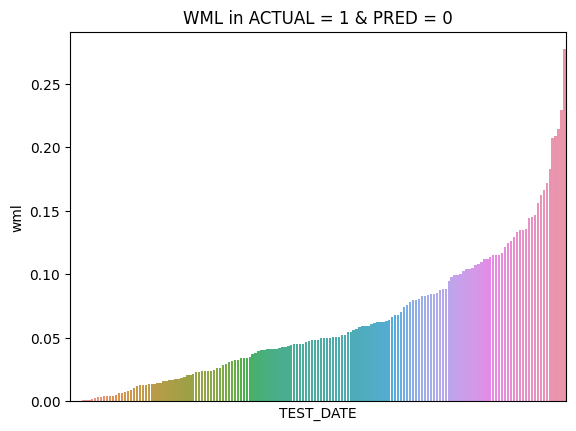

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,167.0,0.06167,0.002701,0.051967,0.000007,0.000489,0.022198,0.048334,0.087719,0.219156,0.276912


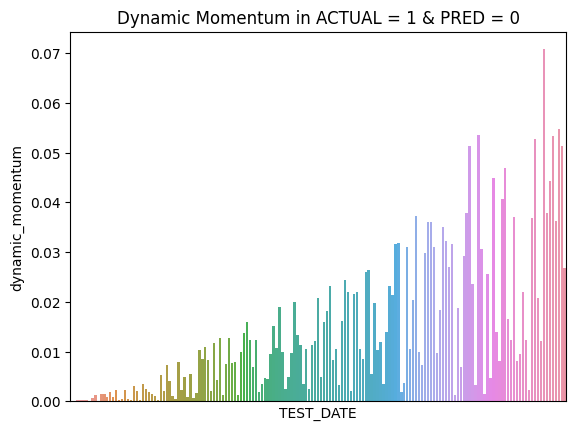

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,167.0,0.014164,0.000211,0.014537,0.000002,0.000077,0.002359,0.009844,0.021418,0.053939,0.070738


In [42]:
plot_predict_result(Fixed_XGB_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
20000229,19800229,20000131,0.330163,0.318754,1.0,0.965444,1,0.218822,0.201291,0.187109,0.205066,0.187712,6392.232705
19991231,19791231,19991130,0.239571,0.235707,1.0,0.983872,1,0.211792,0.193518,0.178931,0.202353,0.213406,4744.886826
20000630,19800630,20000531,0.216883,0.214863,1.0,0.990687,1,0.228636,0.181798,0.188905,0.212767,0.187894,5062.778651
20020430,19820430,20020328,0.210220,0.208238,1.0,0.990573,1,0.215089,0.194590,0.189228,0.253830,0.147263,10252.638054
20020228,19820226,20020131,0.250175,0.189563,1.0,0.757718,1,0.190088,0.191803,0.189618,0.255175,0.173315,8851.135930



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
20090430,19890428,20090331,-0.454349,-0.444493,0.0,0.978306,1,0.213143,0.203815,0.183342,0.215048,0.184653,5086.971322
20201130,20001130,20201030,-0.248070,-0.236775,0.0,0.954468,1,0.184122,0.193153,0.175315,0.254327,0.193082,2842.163615
20210226,20010228,20210129,-0.218901,-0.216529,0.0,0.989165,1,0.192507,0.192713,0.154603,0.247206,0.212972,2250.785427
19700930,19500929,19700831,-0.232139,-0.213873,0.0,0.921315,1,0.222323,0.172223,0.151808,0.232404,0.221242,9.867077
20120131,19920131,20111230,-0.213660,-0.213257,0.0,0.998116,1,0.172804,0.212195,0.203669,0.201679,0.209654,4492.788933


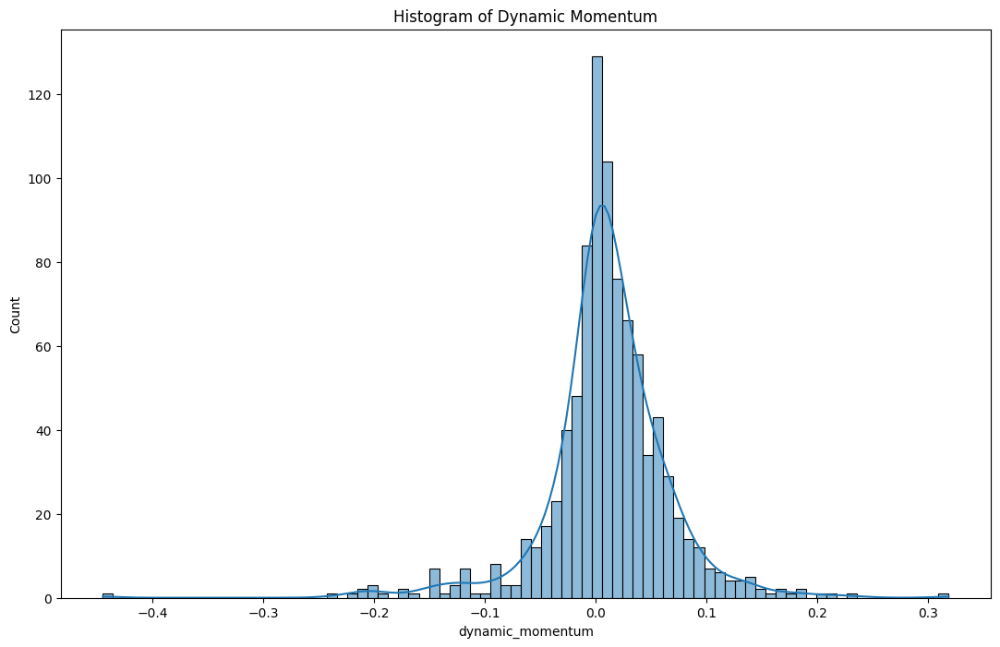

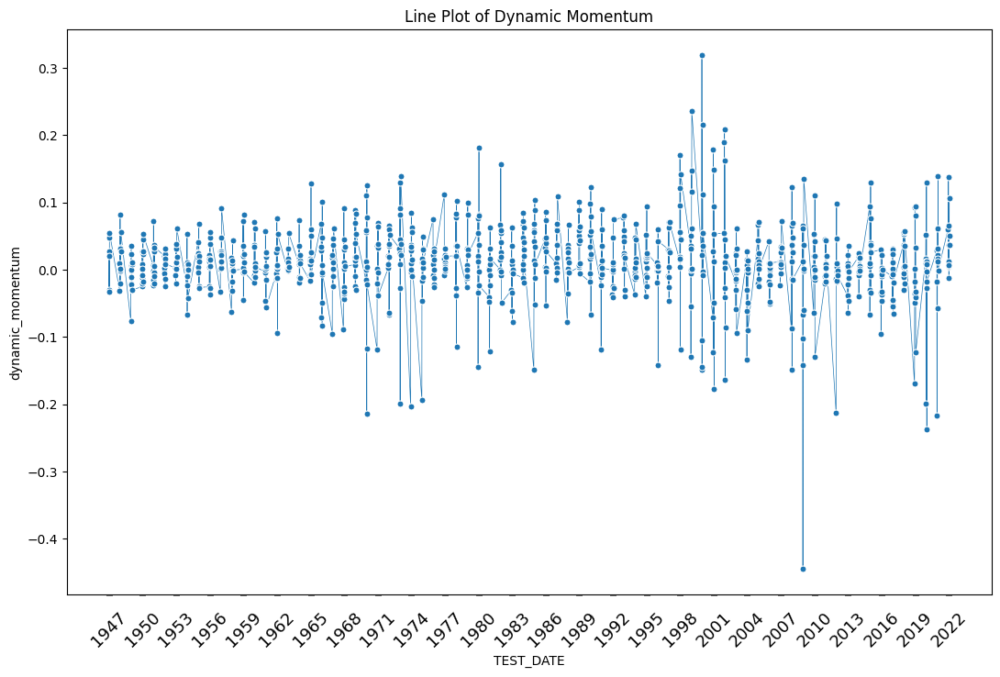

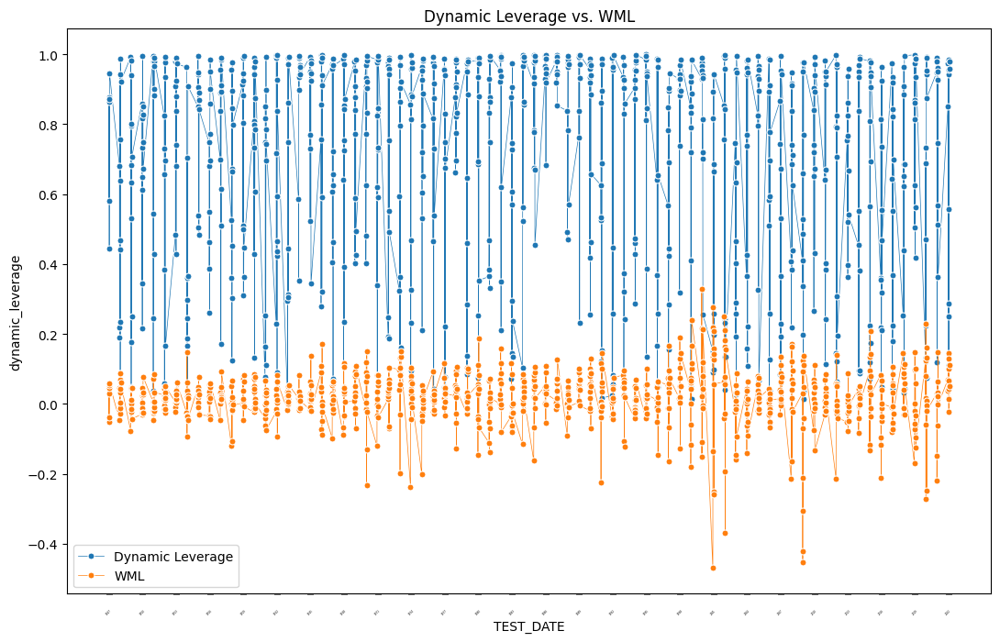

In [43]:
plot_dynamic_momentum(Fixed_XGB_Result)

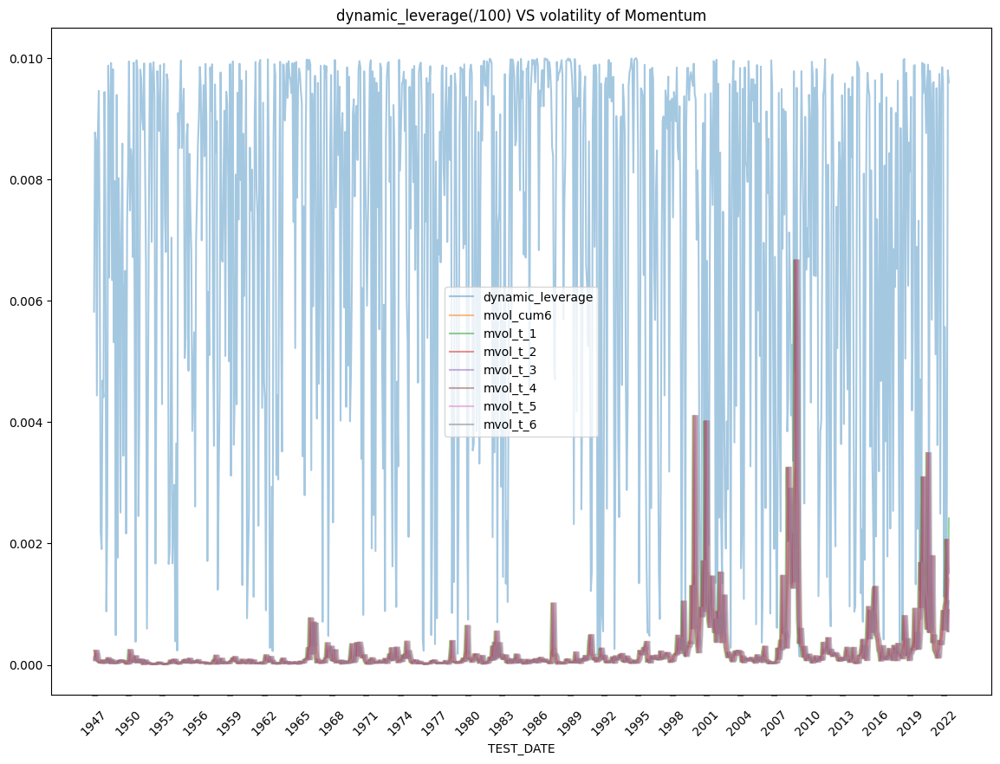

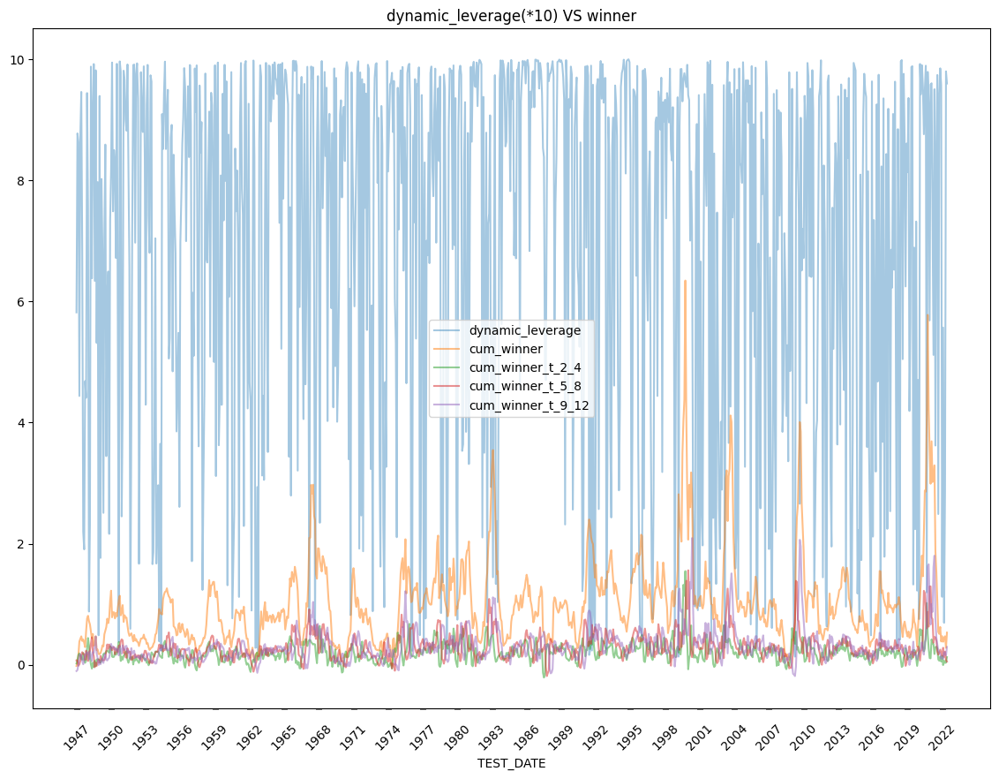

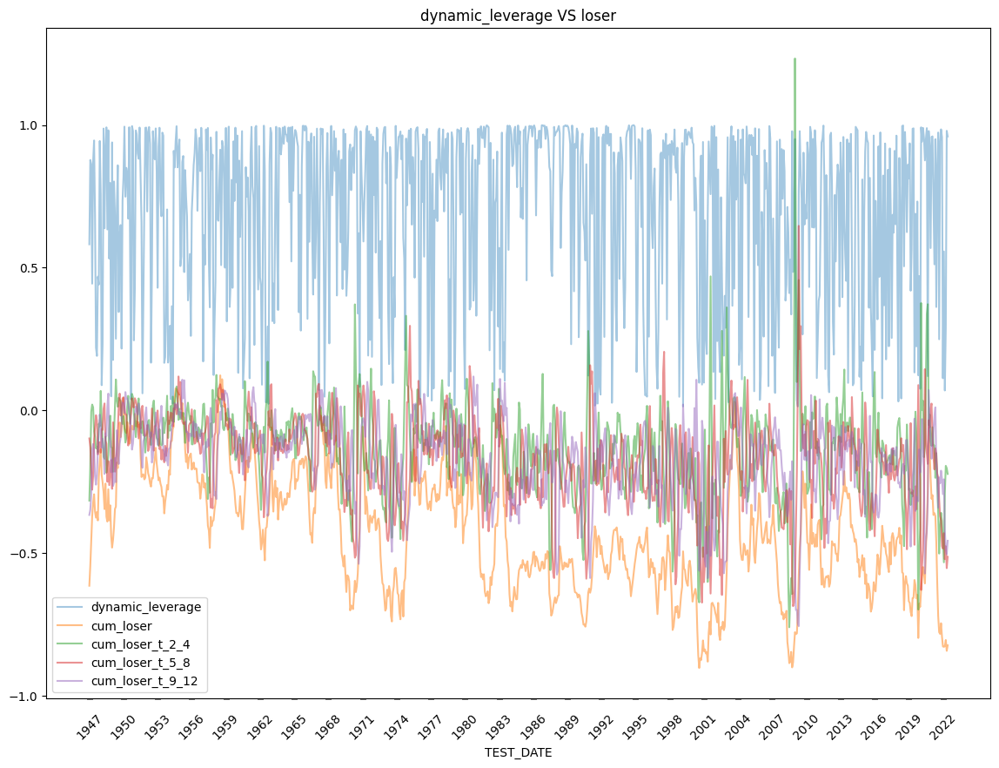

In [58]:
save_XGB = leverage_save(Fixed_XGB_Result, DATA)
save_XGB.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/XGB_{case_name}.csv')



Feature Importance of the model



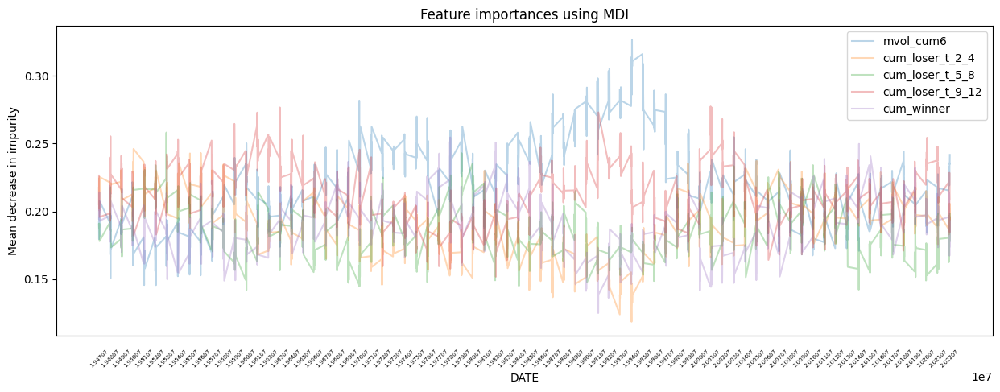

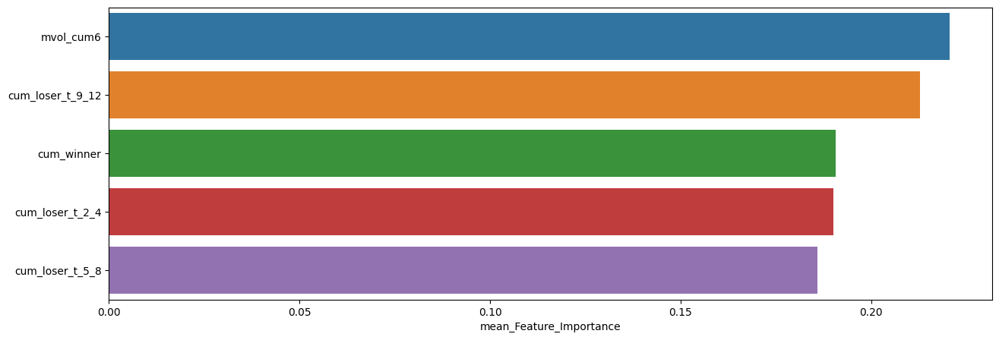

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.220695,0.326317,0.145592
cum_loser_t_9_12,0.212821,0.277395,0.151748
cum_winner,0.190601,0.254490,0.125007
cum_loser_t_2_4,0.190053,0.246058,0.118598
cum_loser_t_5_8,0.185830,0.258129,0.141928


In [45]:
plot_feature_importances(Fixed_XGB_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.28      0.31        75
         1.0       0.67      0.73      0.70       151

    accuracy                           0.58       226
   macro avg       0.50      0.50      0.50       226
weighted avg       0.56      0.58      0.57       226


accuracy : 0.5796460176991151

precision : 0.6707317073170732

recall : 0.7284768211920529

F1-Score : 0.6984126984126985



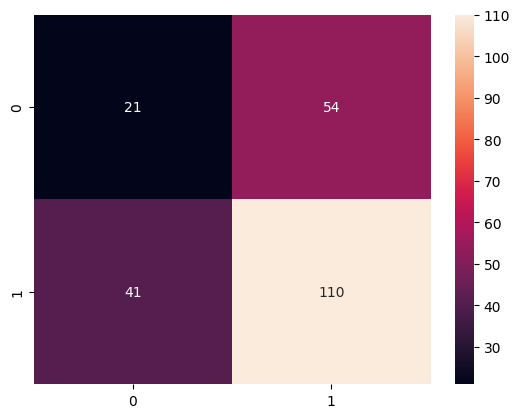


Feature Importance of the model



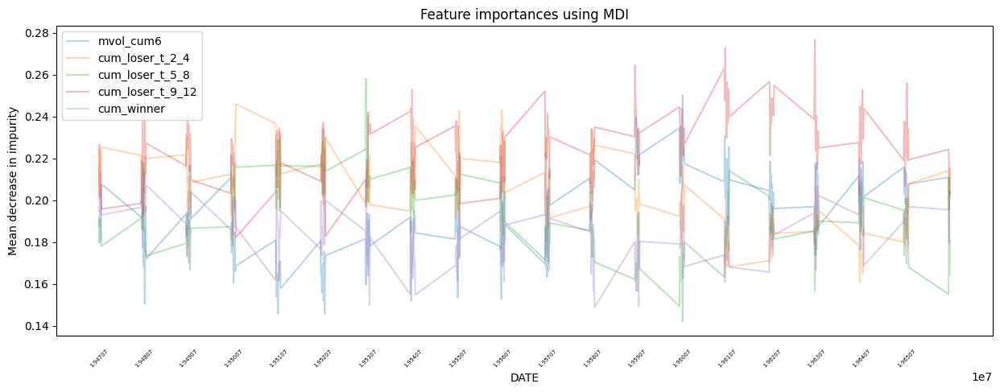

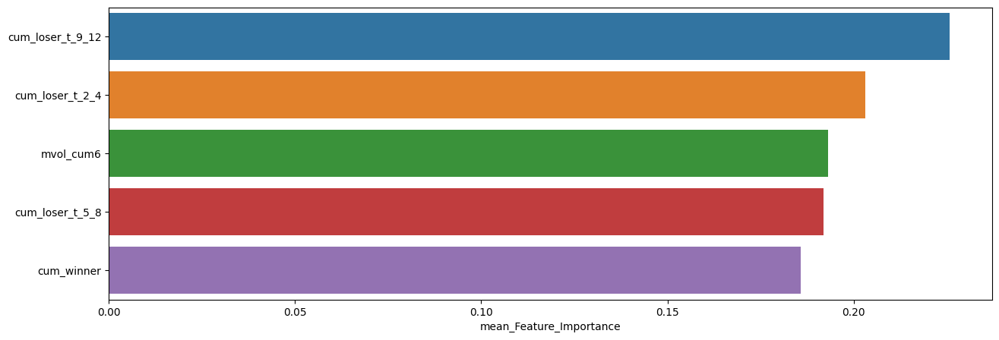

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.225890,0.276592,0.182208
cum_loser_t_2_4,0.203143,0.246058,0.160622
mvol_cum6,0.193141,0.250229,0.145592
cum_loser_t_5_8,0.191995,0.258129,0.141928
cum_winner,0.185831,0.222449,0.148922



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.23      0.26        75
         1.0       0.66      0.75      0.71       151

    accuracy                           0.58       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.5796460176991151

precision : 0.6627906976744186

recall : 0.7549668874172185

F1-Score : 0.7058823529411764



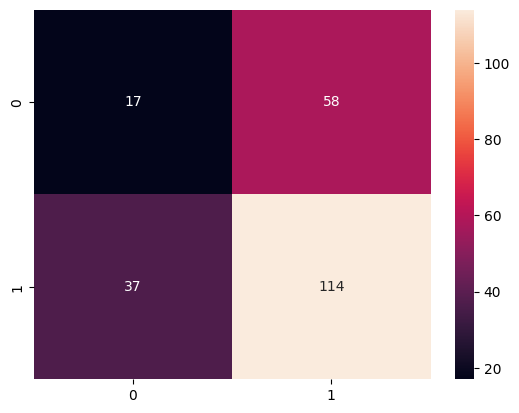


Feature Importance of the model



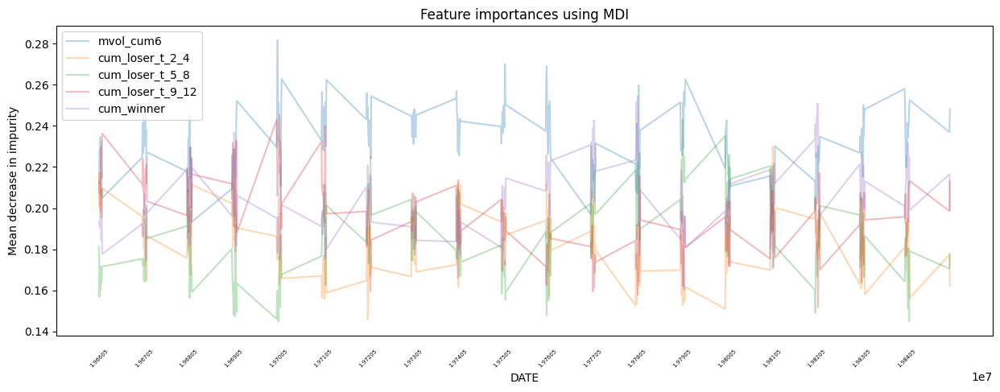

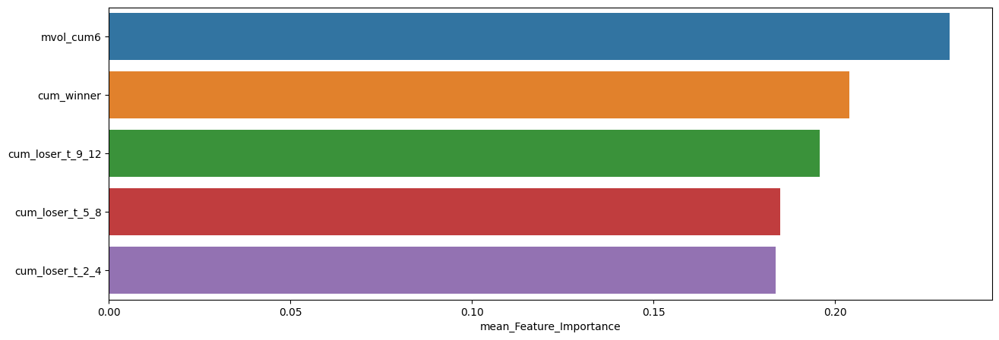

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.231708,0.281666,0.187649
cum_winner,0.203988,0.254490,0.160408
cum_loser_t_9_12,0.195726,0.245552,0.151748
cum_loser_t_5_8,0.184952,0.242923,0.144725
cum_loser_t_2_4,0.183626,0.229973,0.145782



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.31      0.34        70
         1.0       0.71      0.76      0.74       156

    accuracy                           0.62       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.61      0.62      0.61       226


accuracy : 0.6238938053097345

precision : 0.7125748502994012

recall : 0.7628205128205128

F1-Score : 0.7368421052631579



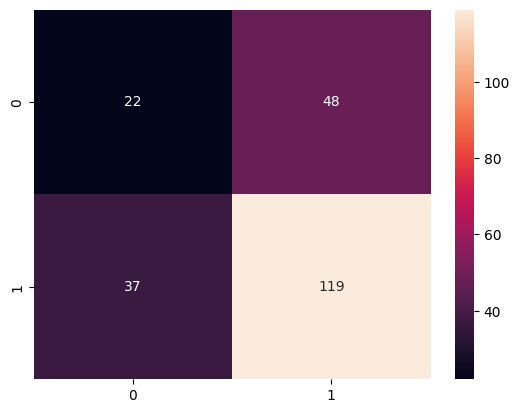


Feature Importance of the model



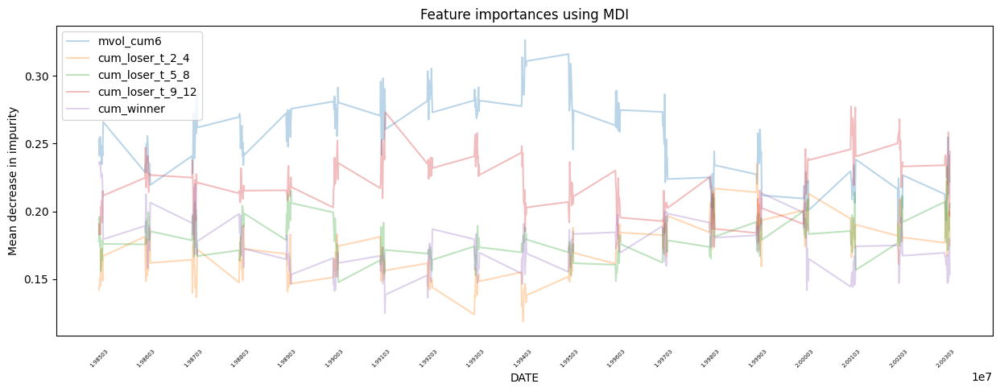

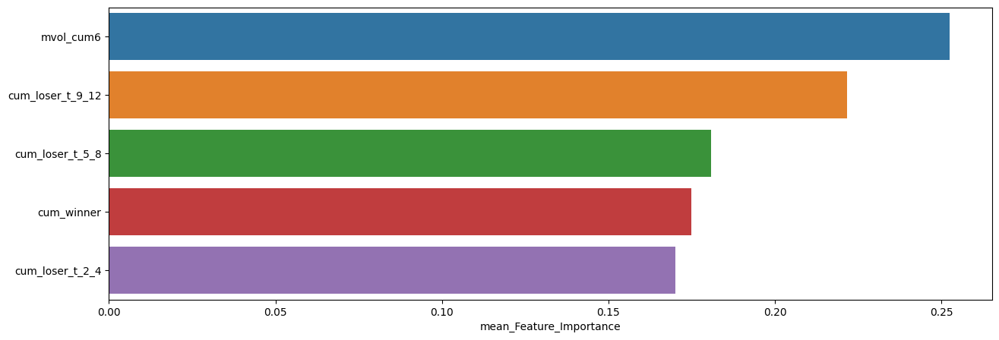

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.252558,0.326317,0.190088
cum_loser_t_9_12,0.221670,0.277395,0.177417
cum_loser_t_5_8,0.180783,0.233338,0.147758
cum_winner,0.174824,0.236674,0.125007
cum_loser_t_2_4,0.170165,0.235164,0.118598



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.30      0.23      0.26        96
         1.0       0.52      0.61      0.56       132

    accuracy                           0.45       228
   macro avg       0.41      0.42      0.41       228
weighted avg       0.43      0.45      0.43       228


accuracy : 0.4473684210526316

precision : 0.5194805194805194

recall : 0.6060606060606061

F1-Score : 0.5594405594405594



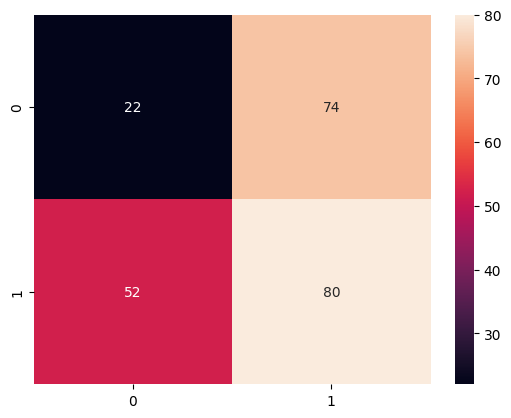


Feature Importance of the model



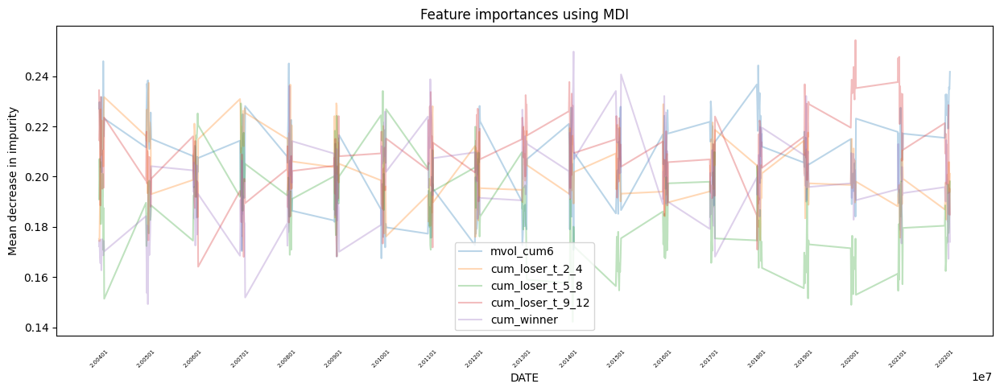

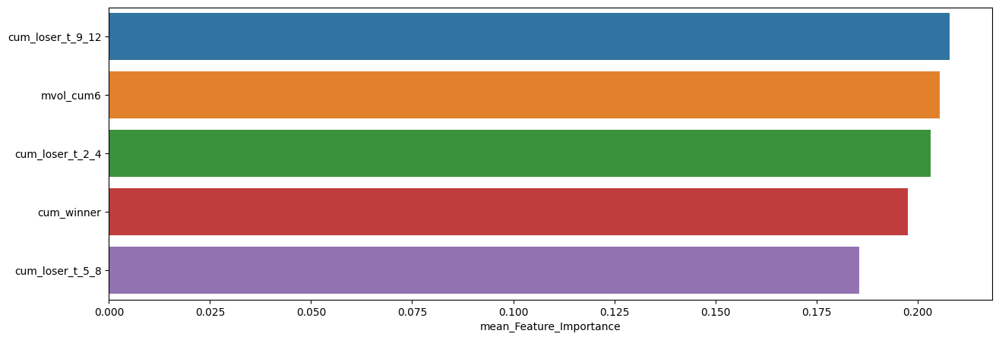

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.208042,0.254327,0.164174
mvol_cum6,0.205506,0.245941,0.167510
cum_loser_t_2_4,0.203160,0.237299,0.174327
cum_winner,0.197698,0.249761,0.149282
cum_loser_t_5_8,0.185594,0.234098,0.142234


In [46]:
slice_feature_importance(Fixed_XGB_Result, 4)

## LGBM

In [47]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

In [48]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM) # 사용할 모델

**************************************************
설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.7120167950487739


최근 누적 수익률

  2022년-12월 -> 4581.21
  2022년-11월 -> 4199.01
  2022년-10월 -> 4037.67
  2022년-09월 -> 3854.50
  2022년-08월 -> 3788.20

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 9034.90
  2등 : 2002년-07월 -> 8914.97
  3등 : 2002년-06월 -> 8828.62
  4등 : 2002년-08월 -> 8713.66
  5등 : 2009년-02월 -> 8700.92
  6등 : 2008년-06월 -> 8324.95
  7등 : 2008년-11월 -> 8015.74
  8등 : 2009년-01월 -> 7971.71
  9등 : 2008년-12월 -> 7883.75
  10등 : 2002년-10월 -> 7668.68



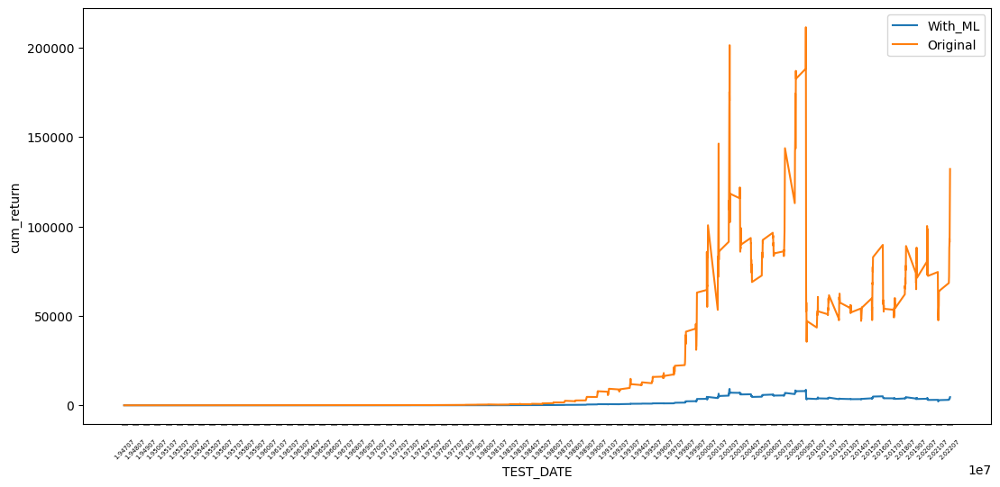

In [49]:
cum_return_sharpe_ratio(data=Fixed_LGBM_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.26      0.30       316
         1.0       0.65      0.75      0.70       590

    accuracy                           0.58       906
   macro avg       0.50      0.50      0.50       906
weighted avg       0.55      0.58      0.56       906


accuracy : 0.5761589403973509

precision : 0.6528189910979229

recall : 0.7457627118644068

F1-Score : 0.6962025316455696



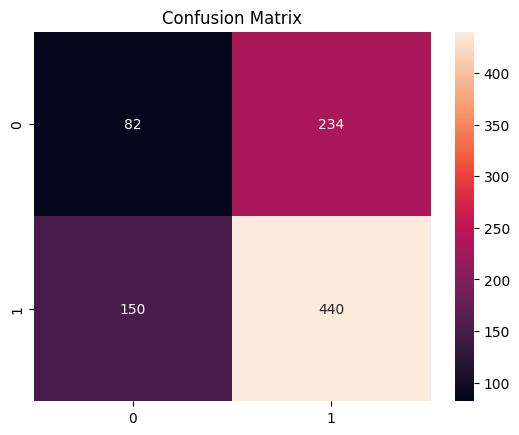


ACTUAL = PRED = 1



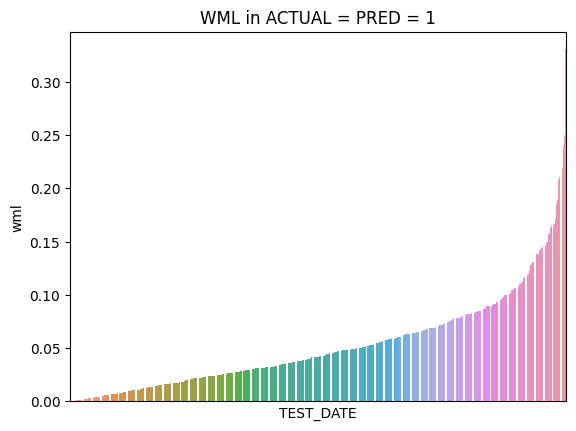

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,440.0,0.052843,0.002039,0.04515,0.000007,0.000785,0.021945,0.042079,0.072198,0.214285,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,440.0,0.041753,0.001403,0.037461,0.000005,0.000541,0.015703,0.031603,0.057029,0.175497,0.316312



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



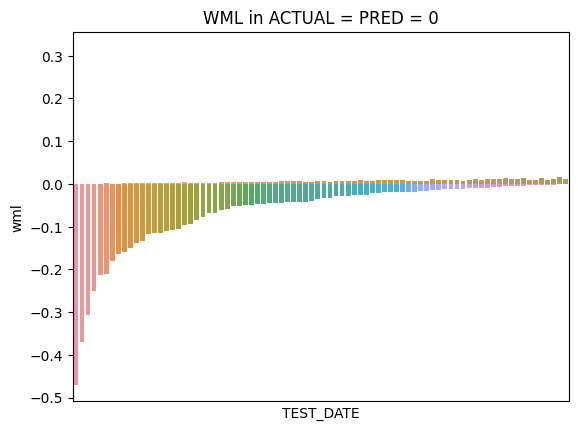

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,82.0,-0.064539,0.007074,0.084109,-0.469903,-0.389014,-0.082798,-0.033635,-0.013277,-0.000445,-0.000183


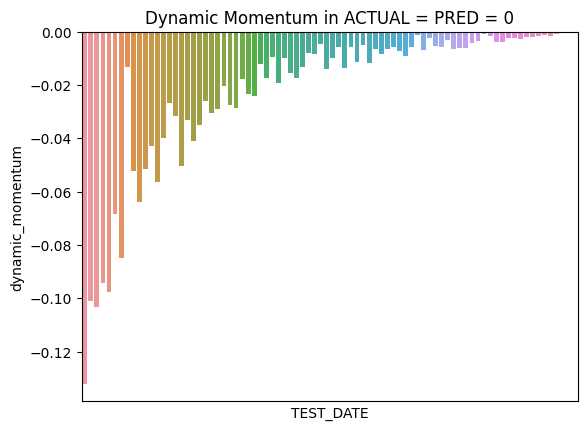

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,82.0,-0.02176,0.000784,0.028,-0.132075,-0.108754,-0.028284,-0.009615,-0.00439,-0.00009,-0.000082



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



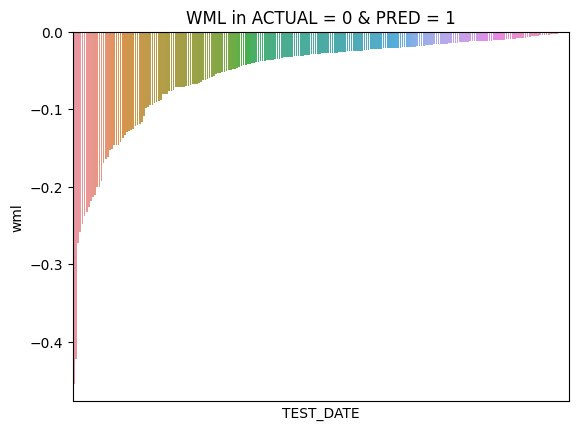

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,234.0,-0.053428,0.004369,0.066097,-0.454349,-0.267286,-0.067189,-0.02793,-0.015294,-0.001145,-0.000132


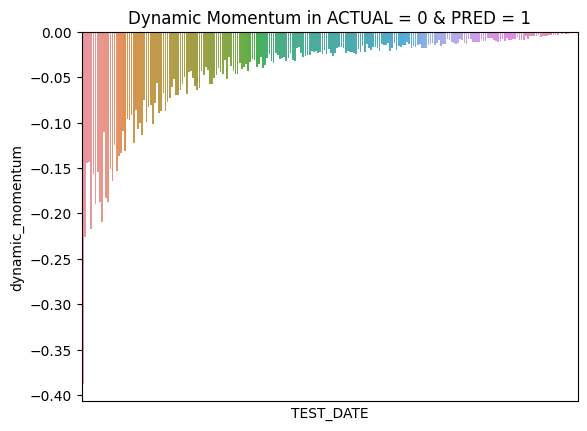

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,234.0,-0.041375,0.002577,0.05076,-0.387558,-0.214419,-0.047716,-0.022553,-0.011682,-0.000751,-0.000099



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



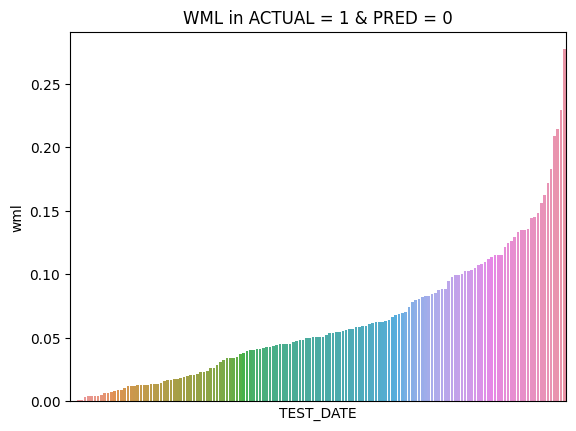

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,150.0,0.062309,0.002589,0.050879,0.000577,0.000747,0.020852,0.050558,0.087921,0.221725,0.276912


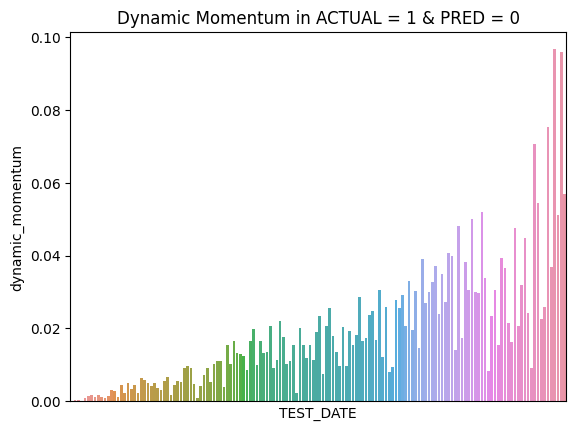

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,150.0,0.018948,0.000297,0.01723,0.000171,0.000271,0.005986,0.015411,0.025874,0.085665,0.096477


In [50]:
plot_predict_result(Fixed_LGBM_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
20000229,19800229,20000131,0.330163,0.316312,1.0,0.958049,1.0,143,197,177,185,159,4759.017911
19991231,19791231,19991130,0.239571,0.229174,1.0,0.956601,1.0,148,174,199,193,138,3541.053085
20020228,19820226,20020131,0.250175,0.203894,1.0,0.815004,1.0,162,212,181,166,125,6516.890275
20020430,19820430,20020328,0.210220,0.189663,1.0,0.902212,1.0,161,192,169,195,140,7482.581457
20000630,19800630,20000531,0.216883,0.181681,1.0,0.837692,1.0,141,202,154,182,173,3780.632657



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_loser_t_2_4,cum_loser_t_5_8,cum_loser_t_9_12,cum_winner,cum_return
TEST_DATE,,,,,,,,,,,,,
20090430,19890428,20090331,-0.454349,-0.387558,0.0,0.852995,1.0,120,173,200,174,174,4127.435471
20090331,19890331,20090227,-0.422400,-0.225351,0.0,0.533500,1.0,132,161,191,193,160,6739.937580
20201130,20001130,20201030,-0.248070,-0.216777,0.0,0.873855,1.0,169,181,159,174,138,3047.331483
20120131,19920131,20111230,-0.213660,-0.209633,0.0,0.981152,1.0,125,181,198,166,186,3403.002485
19700930,19500929,19700831,-0.232139,-0.190010,0.0,0.818520,1.0,186,167,131,188,181,8.517521


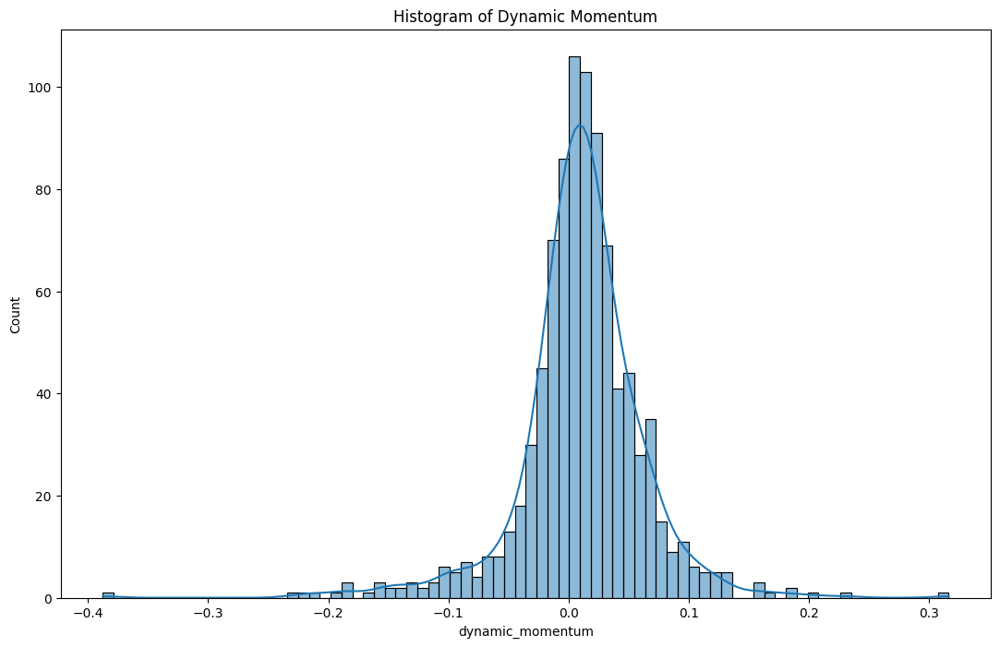

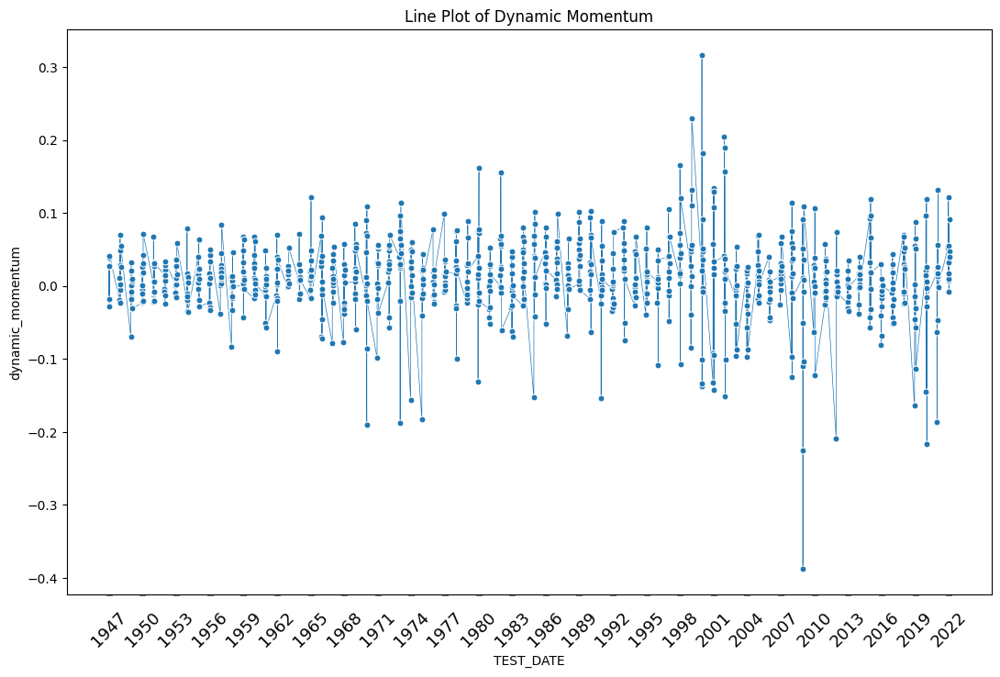

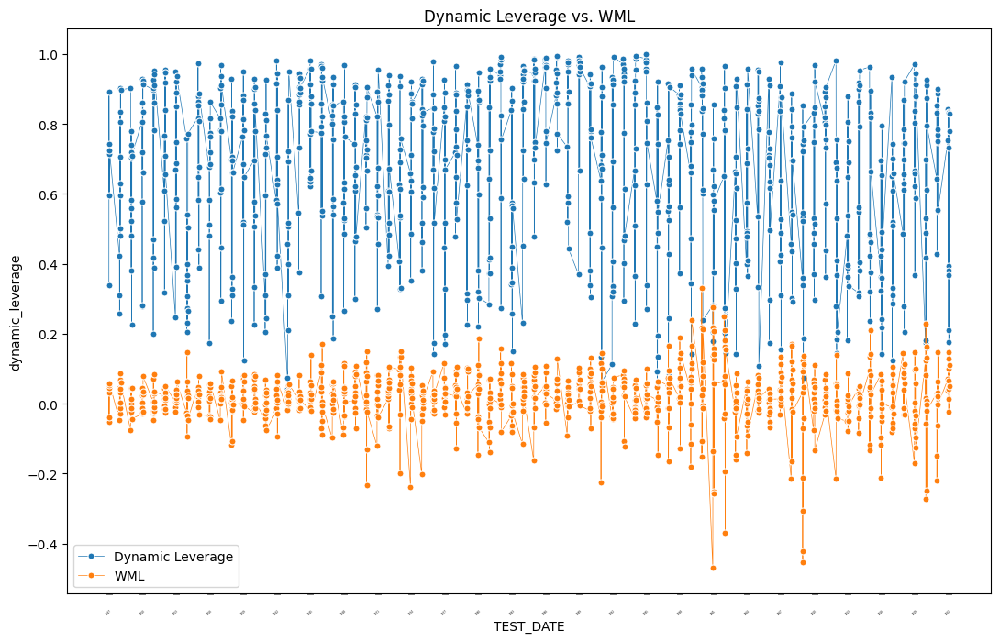

In [51]:
plot_dynamic_momentum(Fixed_LGBM_Result)

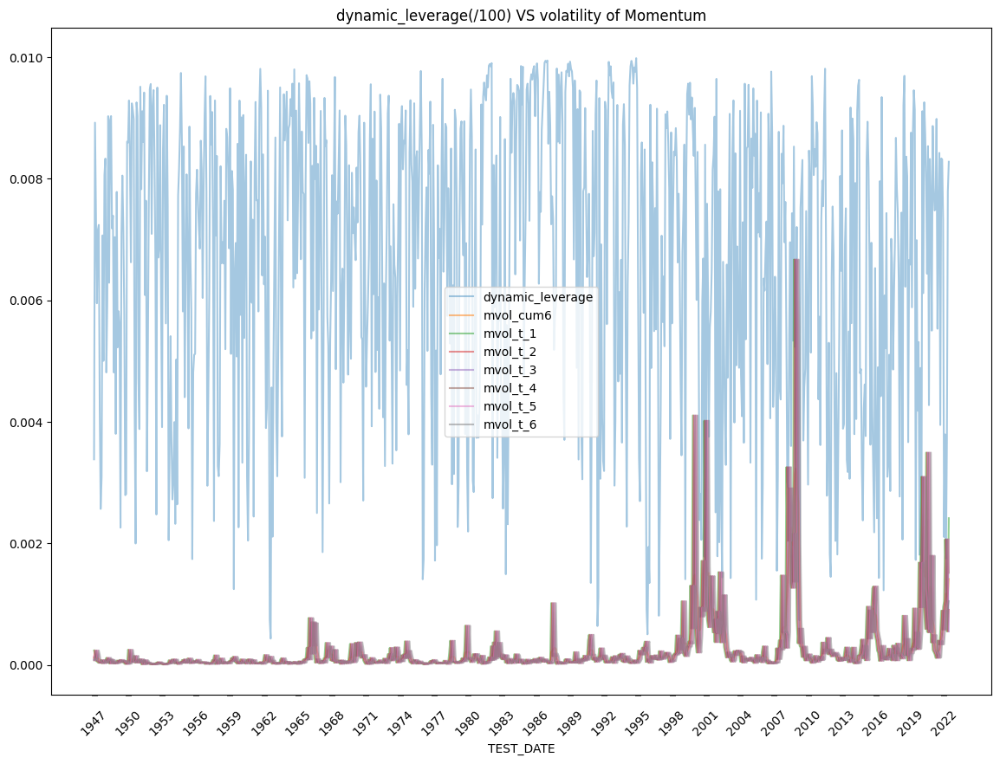

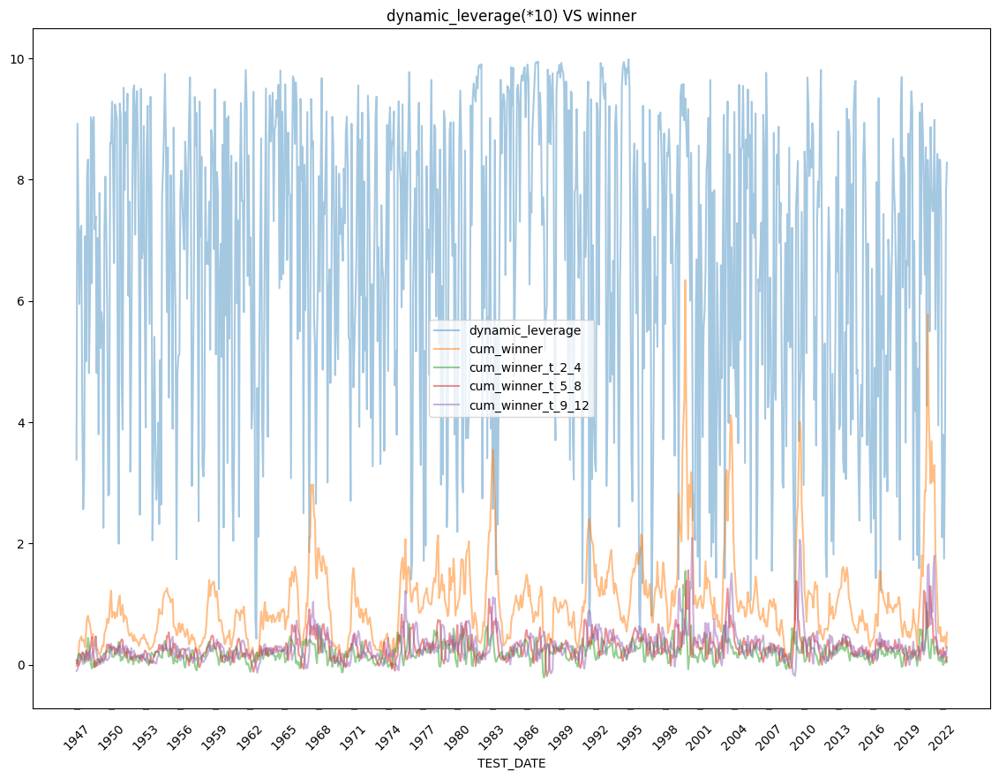

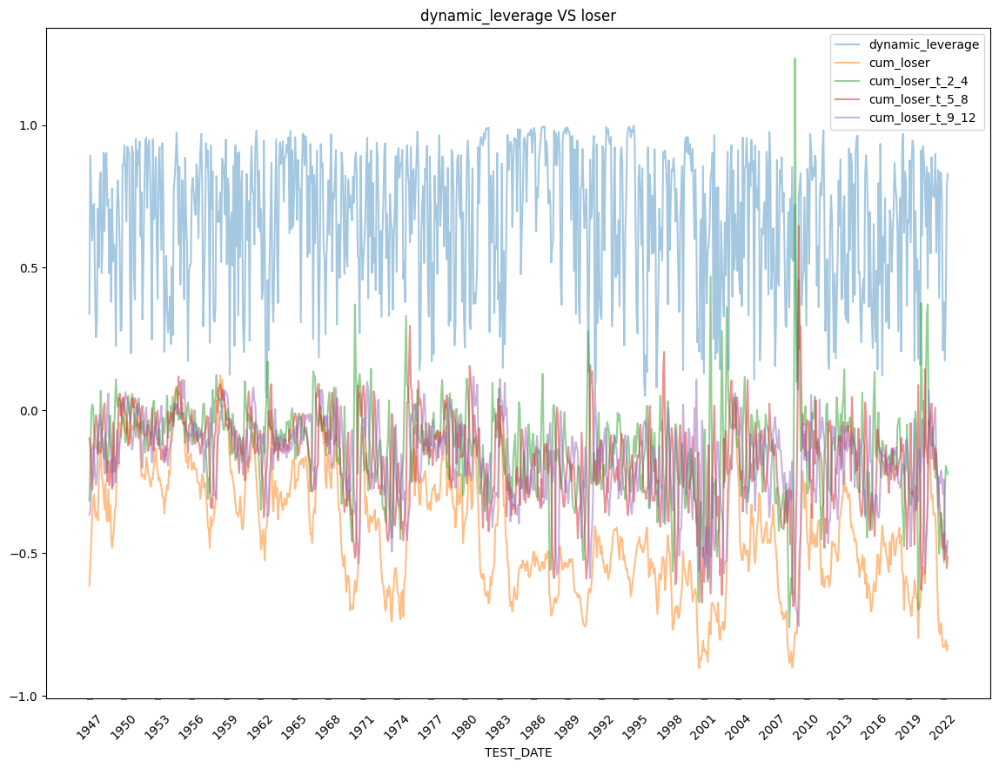

In [59]:
save_LGBM = leverage_save(Fixed_LGBM_Result, DATA)
save_LGBM.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/LGBM_{case_name}.csv')



Feature Importance of the model



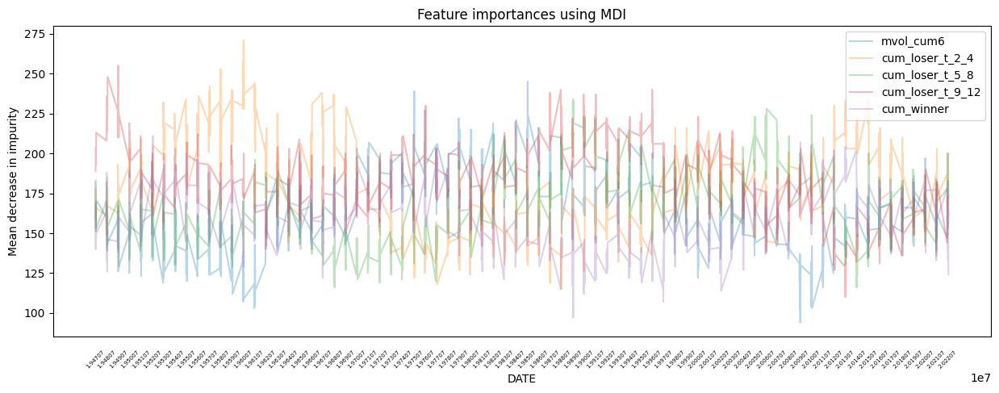

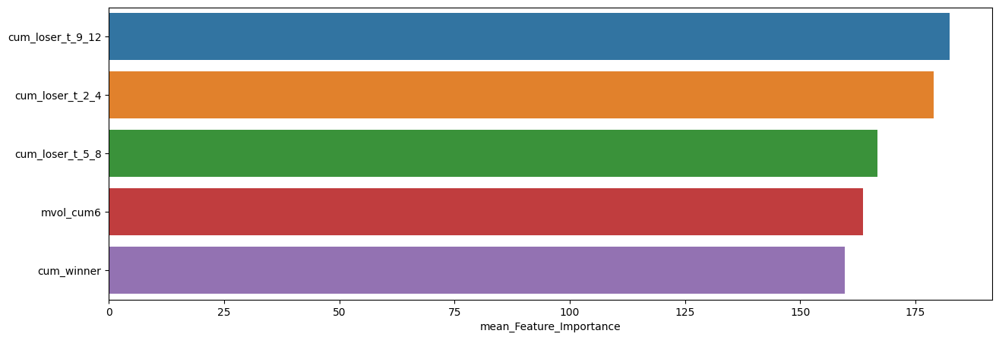

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,182.517660,255,110
cum_loser_t_2_4,178.921634,271,115
cum_loser_t_5_8,166.799117,234,116
mvol_cum6,163.575055,245,94
cum_winner,159.654525,211,97


In [53]:
plot_feature_importances(Fixed_LGBM_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.28      0.33        75
         1.0       0.69      0.79      0.74       151

    accuracy                           0.62       226
   macro avg       0.55      0.54      0.53       226
weighted avg       0.59      0.62      0.60       226


accuracy : 0.6238938053097345

precision : 0.6896551724137931

recall : 0.7947019867549668

F1-Score : 0.7384615384615384



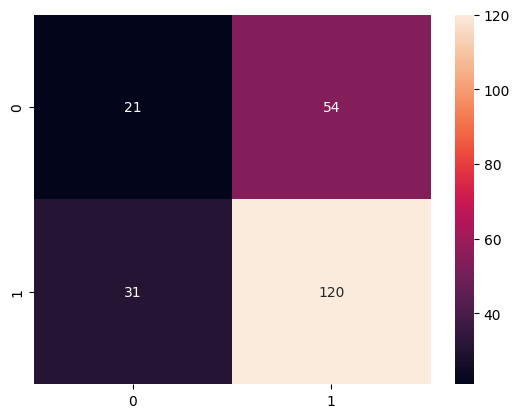


Feature Importance of the model



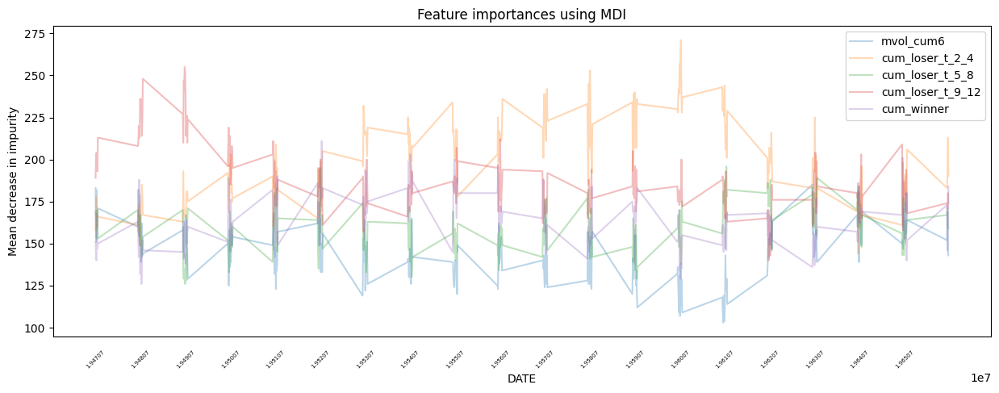

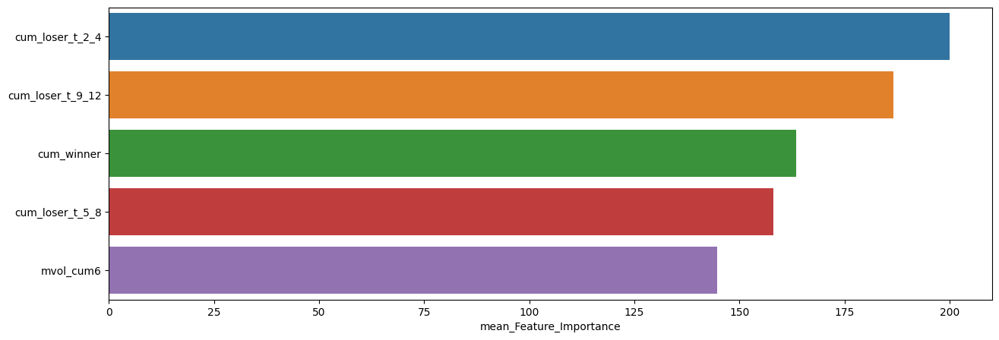

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,200.070796,271,144
cum_loser_t_9_12,186.699115,255,140
cum_winner,163.451327,211,126
cum_loser_t_5_8,158.053097,196,126
mvol_cum6,144.610619,185,103



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.23      0.28        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.61       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.57      0.61      0.58       226


accuracy : 0.6061946902654868

precision : 0.6741573033707865

recall : 0.7947019867549668

F1-Score : 0.729483282674772



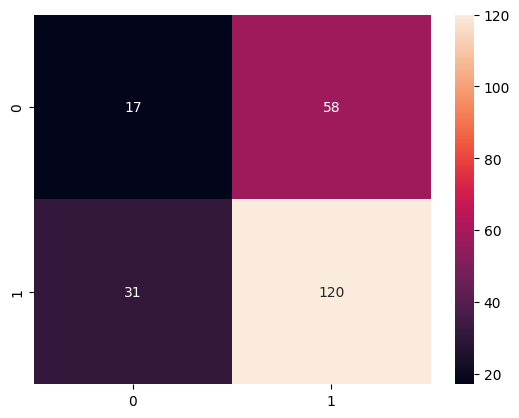


Feature Importance of the model



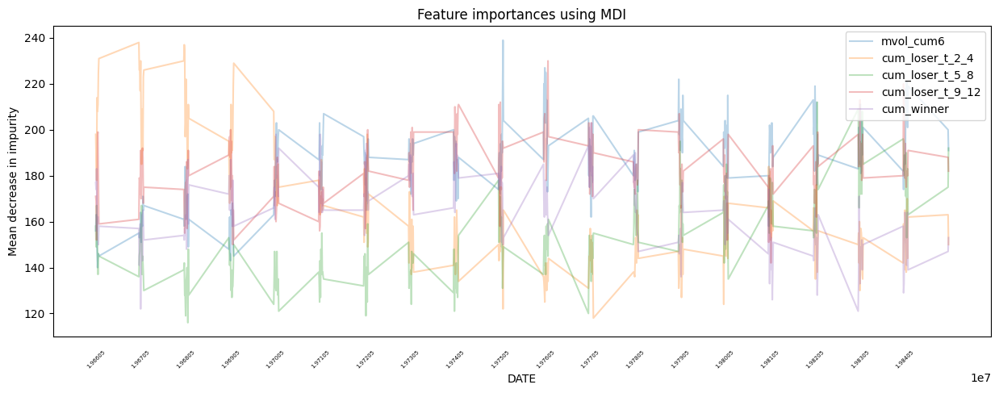

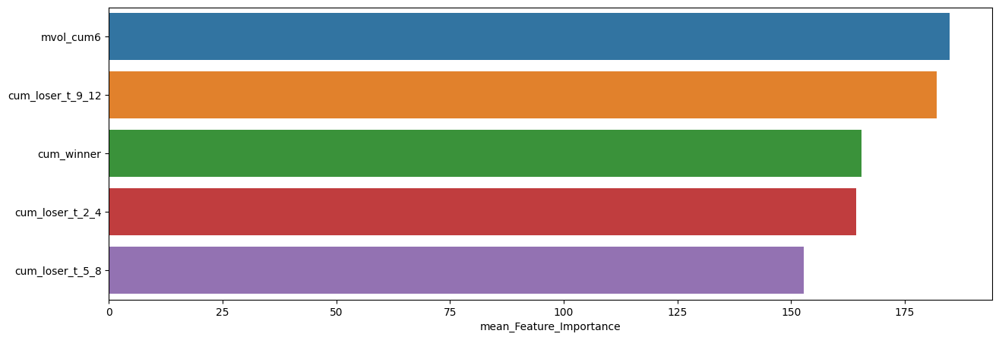

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,184.938053,239,140
cum_loser_t_9_12,182.053097,230,142
cum_winner,165.433628,203,121
cum_loser_t_2_4,164.300885,238,118
cum_loser_t_5_8,152.853982,212,116



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.27      0.31        70
         1.0       0.71      0.79      0.75       156

    accuracy                           0.63       226
   macro avg       0.54      0.53      0.53       226
weighted avg       0.60      0.63      0.61       226


accuracy : 0.6327433628318584

precision : 0.7085714285714285

recall : 0.7948717948717948

F1-Score : 0.7492447129909365



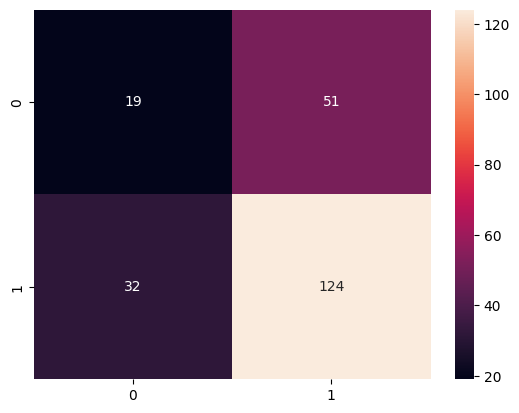


Feature Importance of the model



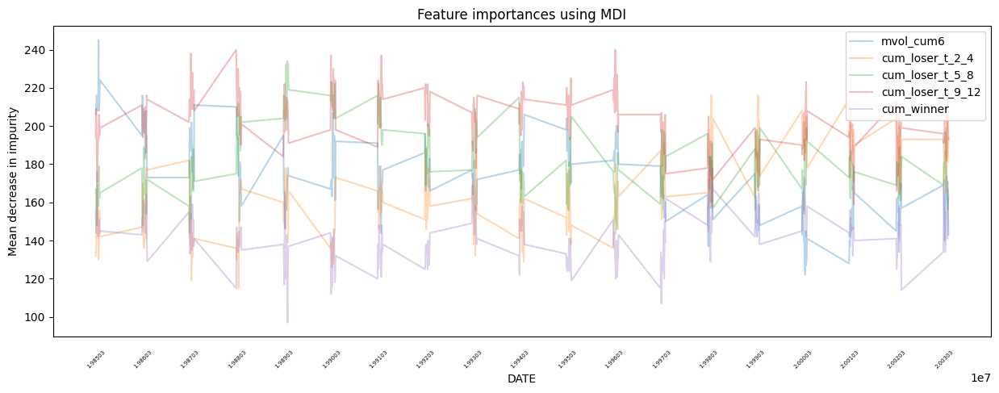

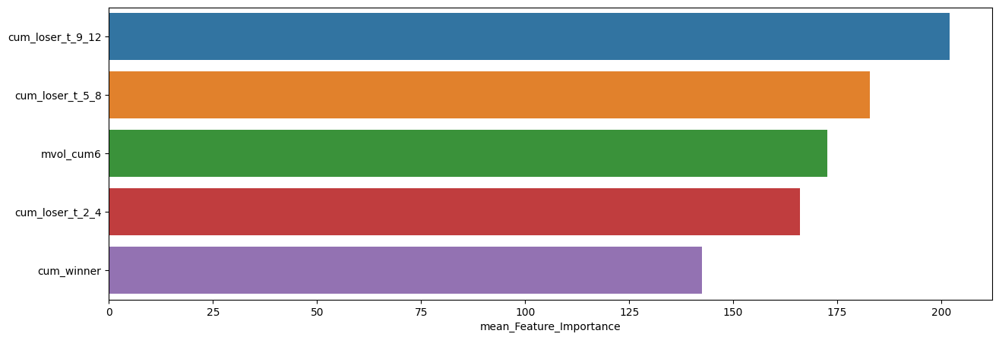

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,202.092920,240,159
cum_loser_t_5_8,182.871681,234,144
mvol_cum6,172.681416,245,122
cum_loser_t_2_4,166.106195,216,115
cum_winner,142.460177,179,97



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.26      0.28        96
         1.0       0.52      0.58      0.54       132

    accuracy                           0.44       228
   macro avg       0.41      0.42      0.41       228
weighted avg       0.43      0.44      0.43       228


accuracy : 0.44298245614035087

precision : 0.5170068027210885

recall : 0.5757575757575758

F1-Score : 0.5448028673835126



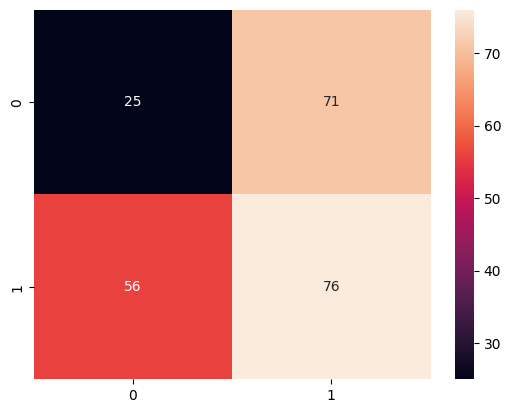


Feature Importance of the model



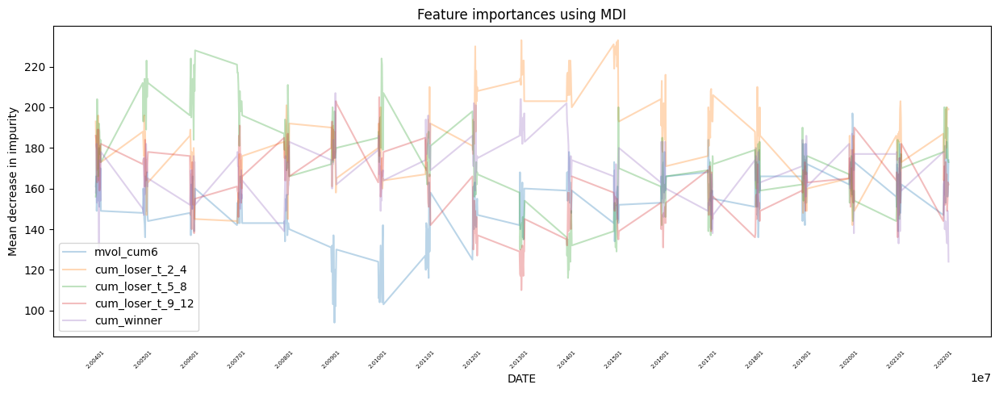

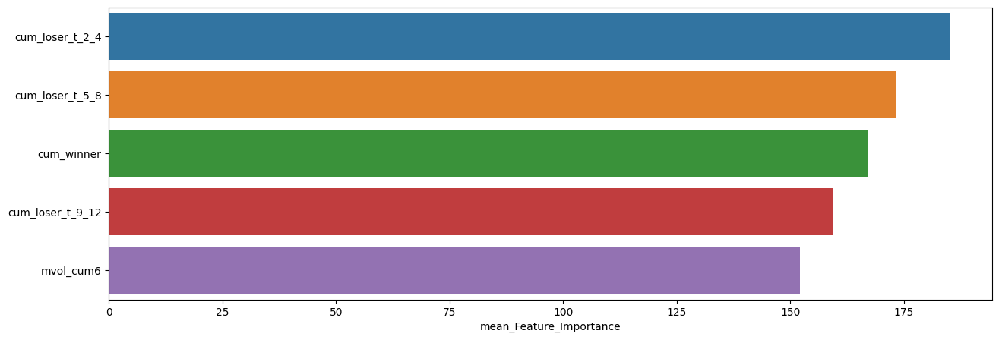

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,185.153509,233,142
cum_loser_t_5_8,173.359649,228,116
cum_winner,167.206140,207,124
cum_loser_t_9_12,159.429825,205,110
mvol_cum6,152.171053,197,94


In [54]:
slice_feature_importance(Fixed_LGBM_Result, 4)

# Compare

## F1 Score

RDF의 F1-Score : 0.7059736229635376
GBC의 F1-Score : 0.7067901234567902
XGB의 F1-Score : 0.6784282277465918
LGBM의 F1-Score : 0.6962025316455696



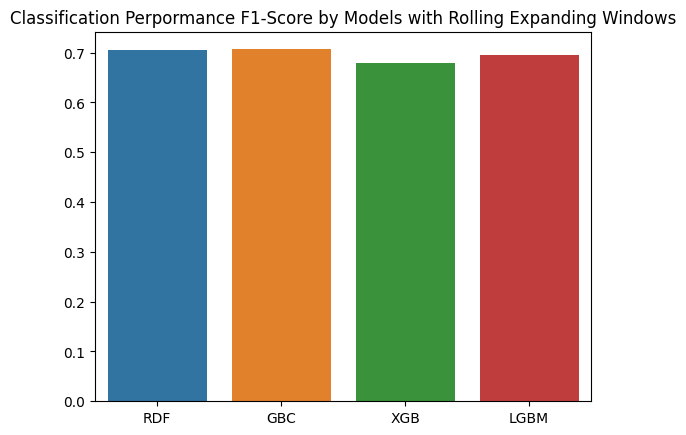

In [61]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'static_leverage'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance F1-Score by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [62]:
def compare_sharpe_ratio(list_model, list_result):

    for model, data in zip(list_model, list_result):

      S = (data['dynamic_momentum'].mean()/data['dynamic_momentum'].std())*math.sqrt(12)
      C = list(data['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=data, x=data.index, y='cum_return', alpha=0.7, label=model)

    CUM_WML = data[['wml']]
    CUM_WML['cum_return'] = (1 + CUM_WML.wml).cumprod() - 1

    org_S = (CUM_WML['wml'].mean()/CUM_WML['wml'].std())*math.sqrt(12)
    org_C = list(CUM_WML['cum_return'])[-1]
    print()
    print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', org_S, org_C))
    print()

    sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
    plt.title('Sharpe Ratio & Cum Return by Model')
    plt.xticks([CUM_WML.index[i] for i in range(0, len(CUM_WML.index), 36)],
              labels=[str(CUM_WML.index[i])[:4] for i in range(0, len(CUM_WML.index), 36)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=10,
                      width=0.1)
    plt.show()

RDF Sharpe Ratio : 0.7713  최종 누적 수익률 : 4863.638960894595
GBC Sharpe Ratio : 0.7684  최종 누적 수익률 : 5668.544974939544
XGB Sharpe Ratio : 0.6788  최종 누적 수익률 : 4506.495639286415
LGBM Sharpe Ratio : 0.7120  최종 누적 수익률 : 4581.206451875234

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353



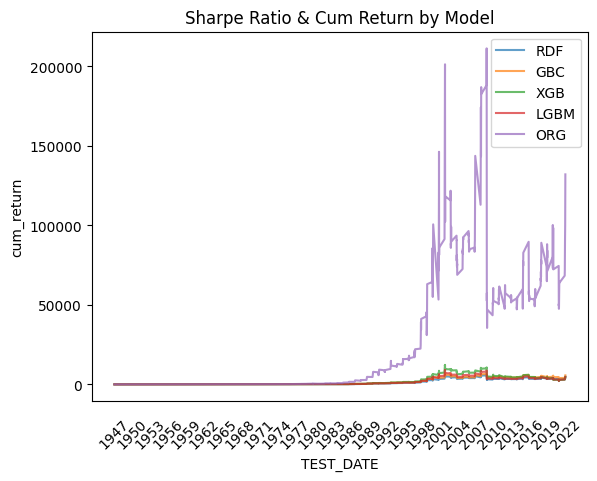

In [63]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result])